# Memoria del Proyecto
# Análisis Exploratorio de Datos Meteorológicos en Euskal Herria (1940–2025)

---

| | |
|---|---|
| **Proyecto** | EDA Weather Change in Basque Country |
| **Fuente de datos** | API Open-Meteo · Reanálisis ERA5 (ECMWF) |
| **Período analizado** | 1940 – 2025 (85 años) |
| **Ciudades** | Bilbo, Donostia, Vitoria-Gasteiz, Iruñea, Baiona, Arrasate, Maule |
| **Herramientas** | Python · Pandas · Matplotlib · Seaborn · NumPy · SciPy · Scikit-learn |

> **Nota de evolución del proyecto:** el planteamiento inicial contemplaba cinco ciudades (Bilbo, Donostia, Vitoria-Gasteiz, Iruñea y Baiona) y el período 1940–2024. Durante el desarrollo se incorporaron Arrasate y Maule para ampliar el gradiente costero-interior, y la serie se extendió hasta 2025 al disponer de datos actualizados. Las hipótesis originales se mantienen íntegras; algunas se refinaron o ampliaron a la luz de los resultados intermedios.

---

## 1. Introducción y contexto

El cambio climático representa uno de los mayores desafíos ambientales de nuestro tiempo. El aumento progresivo de las temperaturas globales, la alteración de los patrones de precipitación y la mayor frecuencia de eventos meteorológicos extremos son fenómenos que ya están afectando de forma tangible a distintas regiones del planeta.

El País Vasco / Euskal Herria, situado en el extremo oriental del Cantábrico y atravesado por los Pirineos occidentales, presenta un clima **atlántico-oceánico** caracterizado por temperaturas suaves, precipitaciones abundantes y una marcada variabilidad estacional. Esta singularidad geográfica lo convierte en un territorio especialmente sensible a las transformaciones climáticas, ya que cualquier desplazamiento en los patrones atmosféricos dominantes puede tener consecuencias directas sobre su ecosistema, recursos hídricos y actividad humana.

El presente análisis exploratorio de datos (EDA) tiene como objetivo estudiar la **evolución meteorológica de las principales ciudades de Euskal Herria** a lo largo del período **1940–2025**, utilizando datos de reanálisis ERA5 proporcionados por la API Open-Meteo. El planteamiento inicial se centró en cinco ciudades representativas — Bilbo, Donostia, Vitoria-Gasteiz, Iruñea y Baiona — cubriendo el gradiente costero-interior del territorio. Posteriormente se incorporaron **Arrasate** (posición intermedia en el corredor del Deba) y **Maule** (referencia del extremo interior norpirenaico), con el fin de enriquecer el análisis del efecto termorregulador del mar y las diferencias climáticas estructurales entre ciudades.

### Objetivos del análisis

- Detectar tendencias de largo plazo en temperatura y precipitación.
- Identificar diferencias climáticas entre ciudades costeras e interiores.
- Cuantificar el aumento de episodios de calor extremo y olas de calor.
- Evaluar cambios en la estacionalidad a lo largo de las décadas.
- Analizar el efecto termorregulador del mar sobre el clima de cada ciudad.
- Detectar si los inviernos fríos (días con Tmin < 0°C) están atenuándose en paralelo al aumento de los extremos cálidos.

## 2. Hipótesis de partida

Las hipótesis se formularon a partir del contexto climático de Euskal Herria y de la literatura científica sobre el cambio climático en el sur de Europa. Se presentan en su formulación original, con las ampliaciones introducidas durante el desarrollo del análisis.

### H1 — Aumento sostenido de las temperaturas
> Las temperaturas medias, mínimas y máximas han experimentado un incremento estadísticamente significativo en las ciudades analizadas a lo largo del período 1940–2025. El análisis de los datos revela que este aumento se articula en **dos fases diferenciadas**: un calentamiento progresivo de la media desde **1980–1990**, y una aceleración pronunciada de los extremos a partir de **2015–2020**.

### H2 — Reducción de las precipitaciones
> La precipitación acumulada anual muestra una tendencia decreciente a lo largo del período analizado, especialmente en los meses de verano, como consecuencia del desplazamiento hacia el norte de los frentes atlánticos. El análisis amplía esta hipótesis incorporando la **paradoja precipitación-intensidad**: aunque el total anual se reduce en el interior, los episodios de lluvia intensa (>30 mm/día) y las rachas secas han aumentado en todas las ciudades.

### H3 — Diferencias climáticas entre ciudades
> Las ciudades del interior (Vitoria-Gasteiz, Iruñea, Arrasate, Maule) presentan una variabilidad térmica anual mayor que las costeras (Bilbo, Donostia, Baiona), y han experimentado un calentamiento relativo más intenso al estar menos reguladas por la influencia marina. El análisis valida esta hipótesis mediante clustering jerárquico sobre 10 variables climáticas estandarizadas.

### H4 — Mayor frecuencia de temperaturas extremas
> El número de días con temperaturas máximas superiores a 35°C ha aumentado de forma notable desde los años 2000, con una **explosión a partir de 2015–2020**. En paralelo, los días con temperaturas mínimas bajo cero han disminuido, indicando una atenuación de los inviernos fríos y una asimetría creciente entre extremos cálidos y fríos.

### H5 — Estacionalidad más marcada
> Los veranos se han vuelto más cálidos, más largos y más secos, mientras que los inviernos son progresivamente más suaves. El análisis confirma el alargamiento del verano meteorológico en todas las ciudades, aunque la amplitud térmica estacional no muestra una tendencia tan clara: el calentamiento invernal compensa parcialmente el estival.

### H6 — Efecto termorregulador del mar *(hipótesis añadida durante el análisis)*
> La distancia al mar explica una parte significativa de la variabilidad climática entre ciudades: mayor distancia implica temperaturas más extremas, más días calurosos y mayor variabilidad interanual. Esta hipótesis surgió de la observación sistemática de las diferencias entre grupos de ciudades y se formalizó con correlaciones de Pearson e intervalos de confianza al 95%.

---

| ID | Hipótesis resumida | Variable principal | Resultado |
|---|---|---|---|
| **H1** | Aumento de temperaturas en dos fases: media desde 1980, extremos desde 2015 | `temperature_2m_max` | ✅ Confirmada |
| **H2** | Reducción de precipitaciones + paradoja intensidad-racha seca | `precipitation_sum` | ⚠️ Parcial |
| **H3** | Interior más variable y más caliente que la costa | `temperature_2m_mean` por ciudad | ✅ Confirmada |
| **H4** | Más días >35°C desde 2015; menos días bajo cero | `temperature_2m_max/min` | ✅ Confirmada |
| **H5** | Veranos más largos, cálidos y secos; inviernos más suaves | Amplitud térmica / verano meteorológico | ⚠️ Parcial |
| **H6** | Distancia al mar explica variabilidad entre ciudades | `dist_mar` · `temperature_2m_mean` | ✅ Confirmada |


## 3. Descripción del dataset

### 3.1 Origen de los datos

Los datos han sido obtenidos a través de la **API pública Open-Meteo**, concretamente del conjunto de datos de reanálisis **ERA5** del ECMWF. ERA5 combina modelos numéricos atmosféricos con observaciones históricas para generar series temporales consistentes y sin huecos, siendo una fuente ampliamente utilizada en climatología e investigación ambiental.

La recopilación se realizó mediante el script `scripts/descargar_datos.py`, que automatiza las consultas a la API en bloques de 10 años por ciudad y almacena los resultados en archivos CSV independientes en la carpeta `data/`.

> **Evolución del dataset:** el dataset inicial incluía cinco ciudades (`clima_donostia.csv`, `clima_bilbao.csv`, `clima_baiona.csv`, `clima_irunea.csv`, `clima_vitoria.csv`) y cubría el período 1940–2024. Durante el análisis se incorporaron `clima_arrasate.csv` y `clima_maule.csv` para completar el gradiente costero-interior, y la serie se actualizó hasta 2025. Los nombres de archivo se normalizaron al formato `clima_<ciudad>.csv` para homogeneidad.

### 3.2 Cobertura temporal y geográfica

- **Período:** 1940–2025 · **Granularidad:** diaria, agregada a mensual/anual para el análisis

| Ciudad | Archivo CSV | Tipo | Dist. al mar |
|---|---|---|---|
| Donostia-San Sebastián | `clima_donostia.csv` | Costera | ~1 km |
| Bilbo / Bilbao | `clima_bilbo.csv` | Costera | ~11 km |
| Bayona / Baiona | `clima_baiona.csv` | Costera | ~6 km |
| Pamplona / Iruñea | `clima_iruna.csv` | Interior | ~68 km |
| Vitoria-Gasteiz | `clima_gasteiz.csv` | Interior | ~57 km |
| Arrasate / Mondragón *(añadida)* | `clima_arrasate.csv` | Interior | ~33 km |
| Maule / Mauléon *(añadida)* | `clima_maule.csv` | Interior | ~80 km |

### 3.3 Variables disponibles

| Variable | Descripción |
|---|---|
| `time` | Fecha de la observación |
| `año` / `mes` | Campos derivados para agrupación |
| `temperature_2m_mean` | Temperatura media diaria a 2 m (°C) |
| `temperature_2m_max` | Temperatura máxima diaria a 2 m (°C) |
| `temperature_2m_min` | Temperatura mínima diaria a 2 m (°C) |
| `precipitation_sum` | Precipitación acumulada diaria (mm) |
| `wind_speed_10m_max` | Velocidad máxima del viento a 10 m (km/h) |

### 3.4 Estructura del proyecto

```
EDA-Weather-Change-in-Basque-Country/
├── data/                          # CSVs por ciudad
├── img/                           # Gráficos generados
│   ├── temp_30/                   # H1 — días > 30°C
│   ├── temp_media/                # H1 — temperatura media y anomalía
│   ├── precipitacion/             # H2 — precipitación y rachas
│   ├── comp_ciudades/             # H3 — comparativa y clustering
│   ├── extremos_35/               # H4 — extremos y olas de calor
│   ├── estacionalidad/            # H5 — estacionalidad y verano
│   └── correlacion_mar/           # H6 — correlación distancia al mar
├── notebooks/                     # Notebooks por hipótesis + Memoria
├── scripts/
│   ├── variables.py               # Clase Ciudad, CIUDADES, constantes
│   ├── funciones_variables.py     # cargar_datos(), estilo_ax()
│   ├── descargar_datos.py         # Descarga ERA5 vía Open-Meteo
│   ├── analisis/                  # Módulos de cálculo puro
│   │   ├── temperaturas.py
│   │   ├── precipitaciones.py
│   │   ├── estacionalidad.py
│   │   ├── anomalia_termica.py
│   │   ├── racha_seca.py
│   │   ├── olas_calor.py
│   │   ├── clustering_ciudades.py
│   │   ├── verano_meteorologico.py
│   │   └── correlacion_mar.py
│   └── graficos/                  # Módulos de visualización
│       ├── graficos_temp.py
│       ├── graficos_precip.py
│       ├── graficos_estacionalidad.py
│       ├── graficos_anomalia.py
│       ├── graficos_racha_seca.py
│       ├── graficos_olas_calor.py
│       ├── graficos_clustering.py
│       ├── graficos_verano.py
│       └── graficos_correlacion.py
└── main.py
```

## 4. Carga de datos

In [49]:
from scripts.variables import CIUDADES, crear_dirs
from scripts.funciones_variables import cargar_datos
from scripts.analisis import (
    temperaturas, precipitaciones, estacionalidad,
    anomalia_termica, racha_seca, olas_calor,
    clustering_ciudades, verano_meteorologico, correlacion_mar
)
from scripts.graficos import (
    graficos_temp, graficos_precip, graficos_estacionalidad,
    graficos_anomalia, graficos_racha_seca, graficos_olas_calor,
    graficos_clustering, graficos_verano, graficos_correlacion
)

crear_dirs()

cargar_datos()

📂 Cargando datos...
  ✅ bilbo: 31,412 filas
  ✅ donostia: 31,412 filas
  ✅ gasteiz: 31,412 filas
  ✅ iruna: 31,412 filas
  ✅ baiona: 31,412 filas
  ✅ arrasate: 31,412 filas
  ✅ maule: 31,412 filas



## 5. Análisis por hipótesis

---

### H1 — Aumento sostenido de las temperaturas

**Hipótesis:** Las temperaturas medias y máximas han aumentado de forma significativa en el período 1940–2025, con dos fases diferenciadas: un calentamiento gradual de la media desde **1980–1990** y una aceleración pronunciada de los extremos a partir de **2015–2020**.

#### Metodología

El análisis se articula en cuatro capas de evidencia:

1. **Días con Tmax > 30°C por año** — indicador directo del calentamiento progresivo. Media móvil de 10 años para revelar la tendencia de fondo.
2. **Temperatura media anual con tendencia lineal** — cuantifica el ritmo de calentamiento en °C por década mediante regresión lineal.
3. **Heatmap año × mes** — permite identificar qué meses y décadas concentran el calentamiento.
4. **Anomalía térmica (base OMM 1961–1990)** — estándar climatológico internacional que expresa cuánto se desvía cada año de la media histórica. Barras rojas = año más cálido que la media.

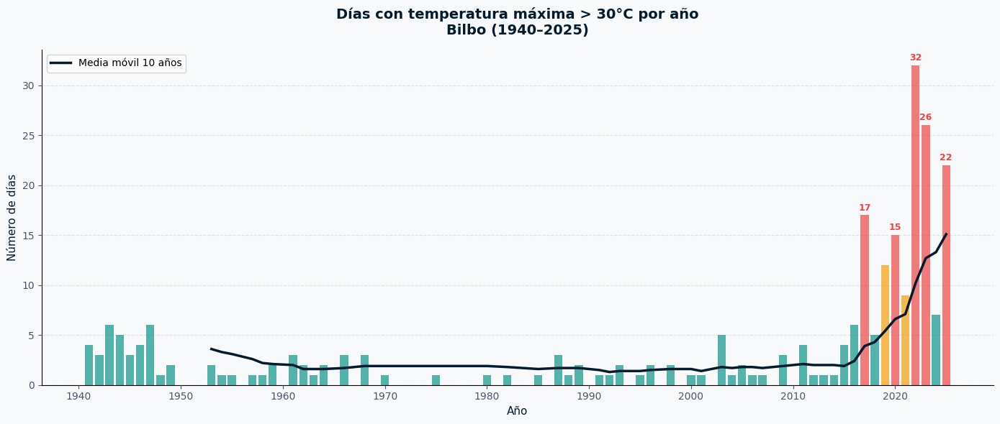

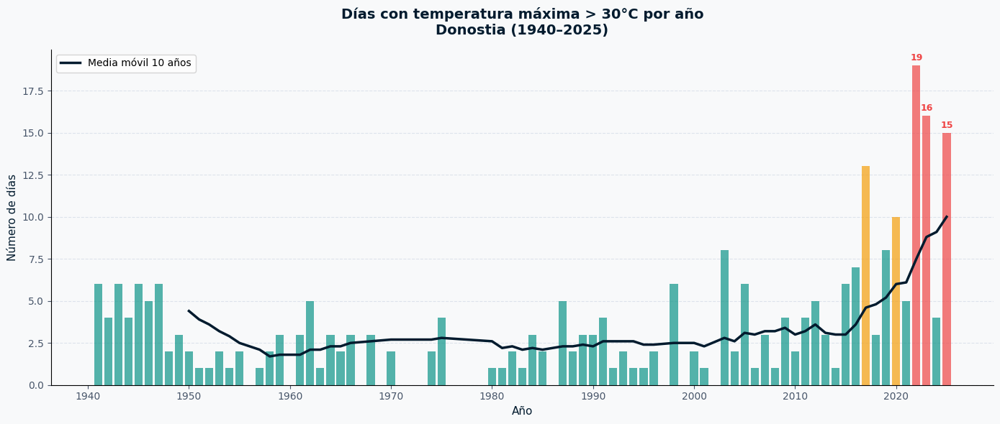

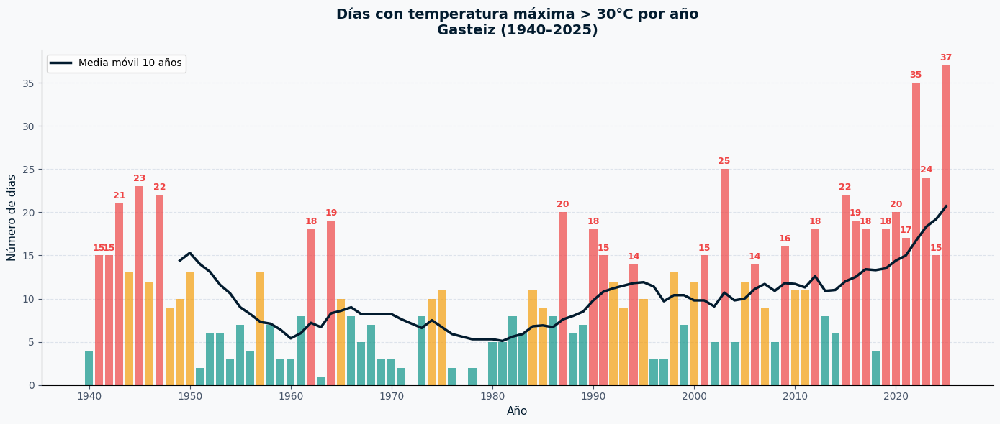

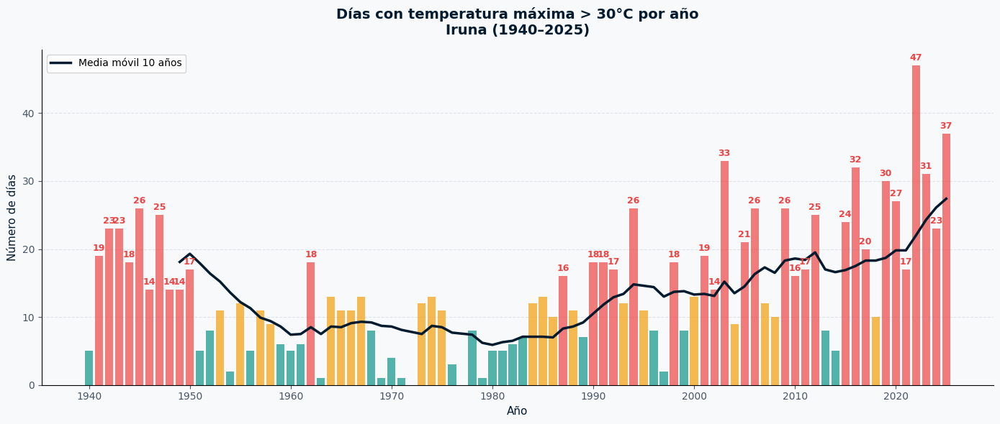

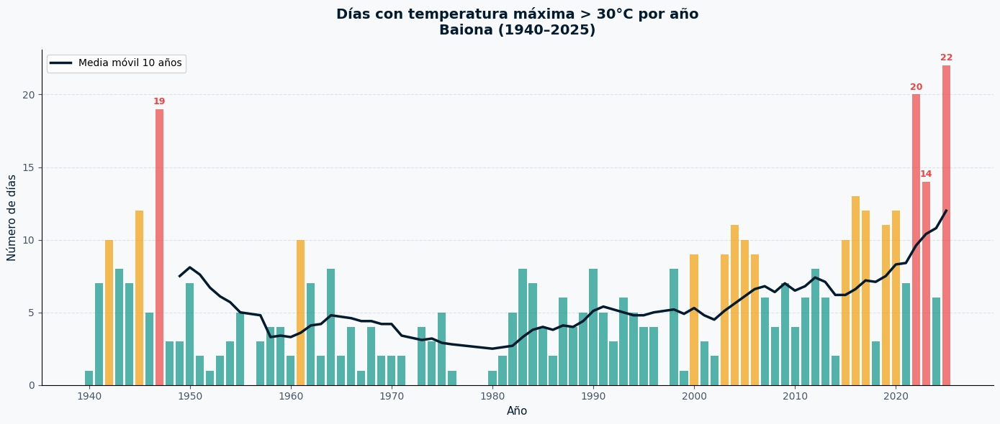

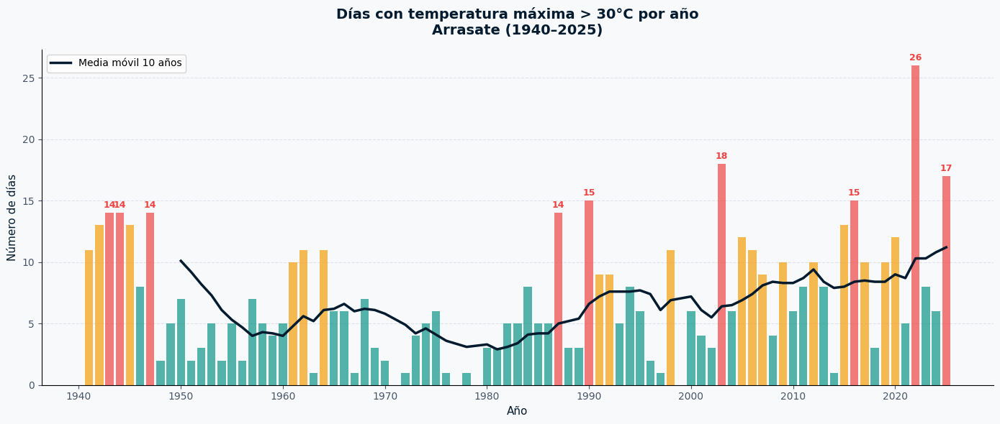

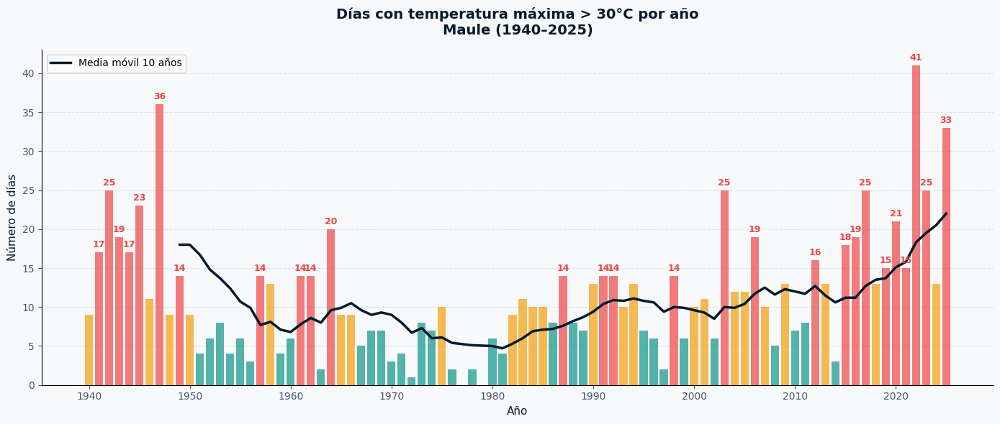

In [50]:
datos_temp = temperaturas.calcular_todos()
graficos_temp.graficar_dias_30(datos_temp['dias_30'])

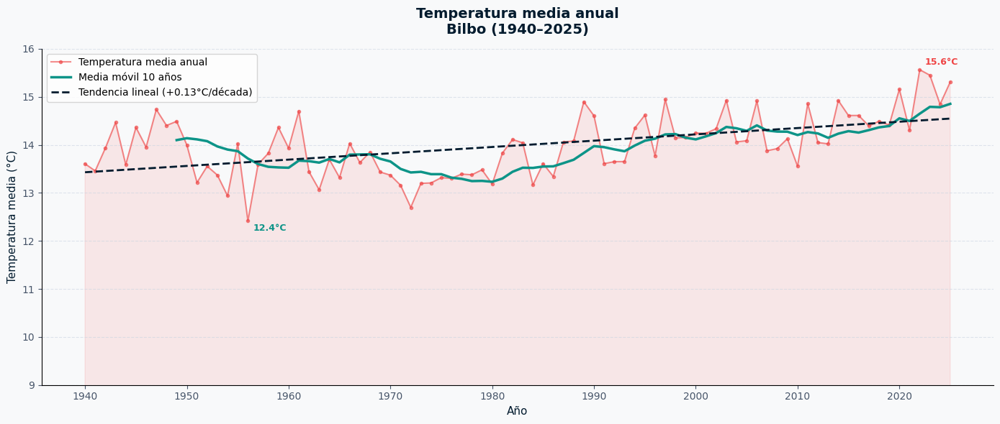

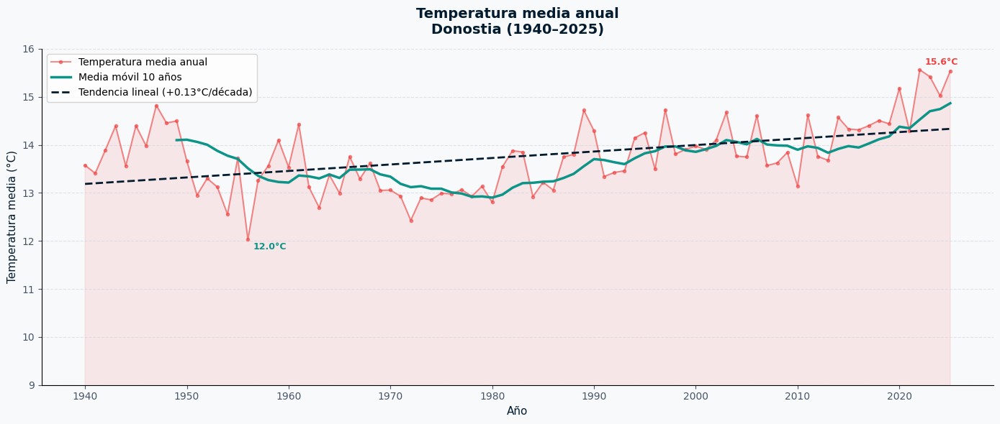

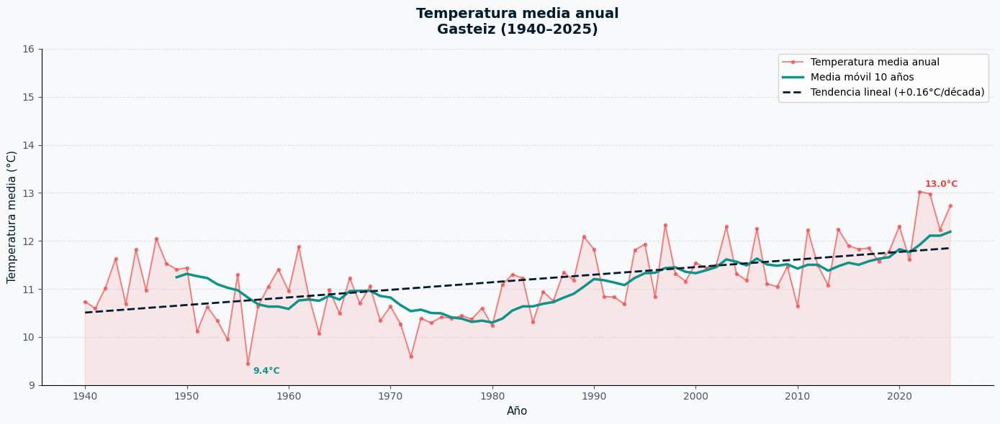

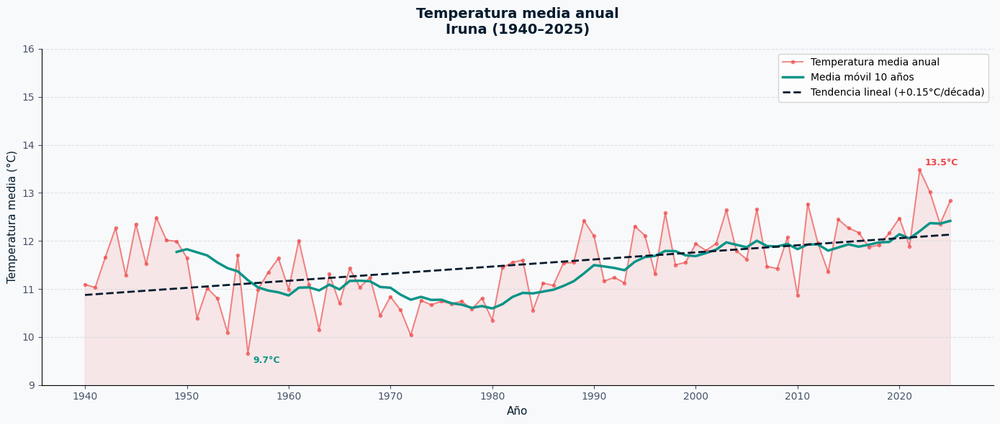

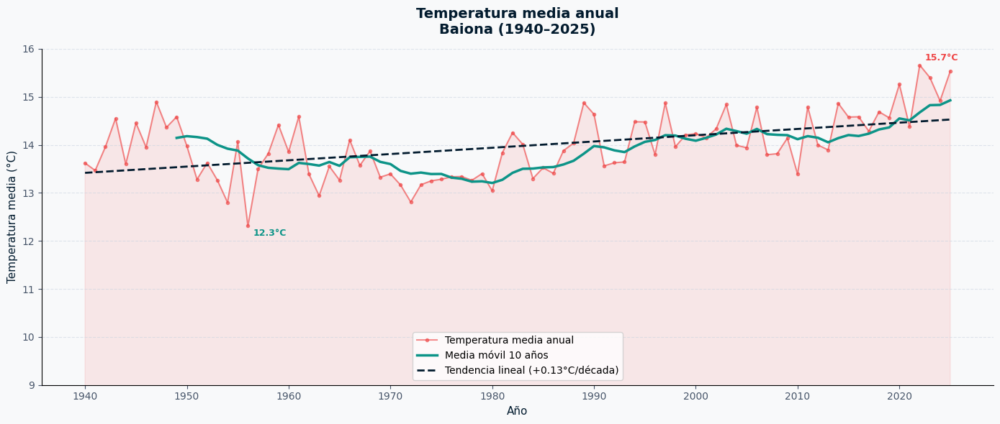

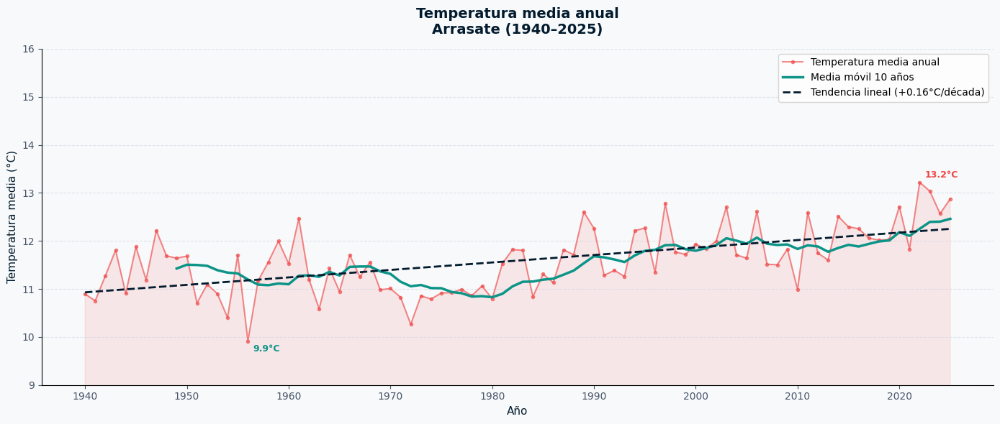

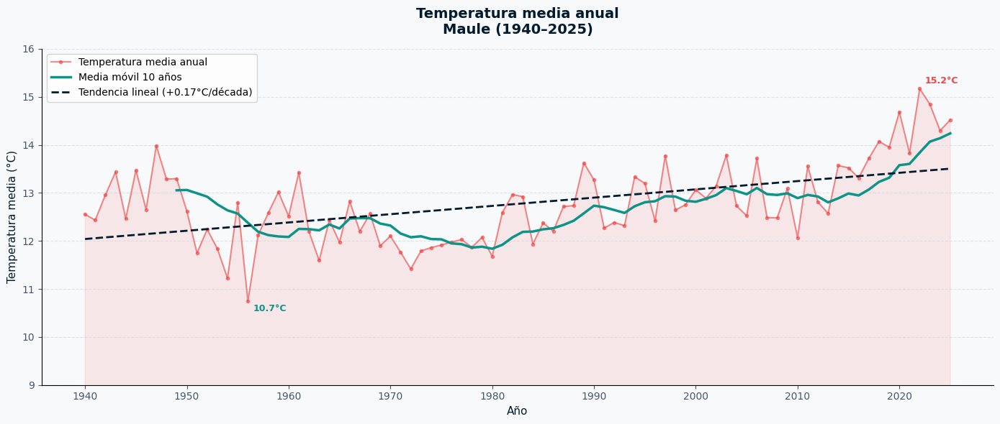

In [51]:
graficos_temp.graficar_temp_media_anual(datos_temp['temp_media'])

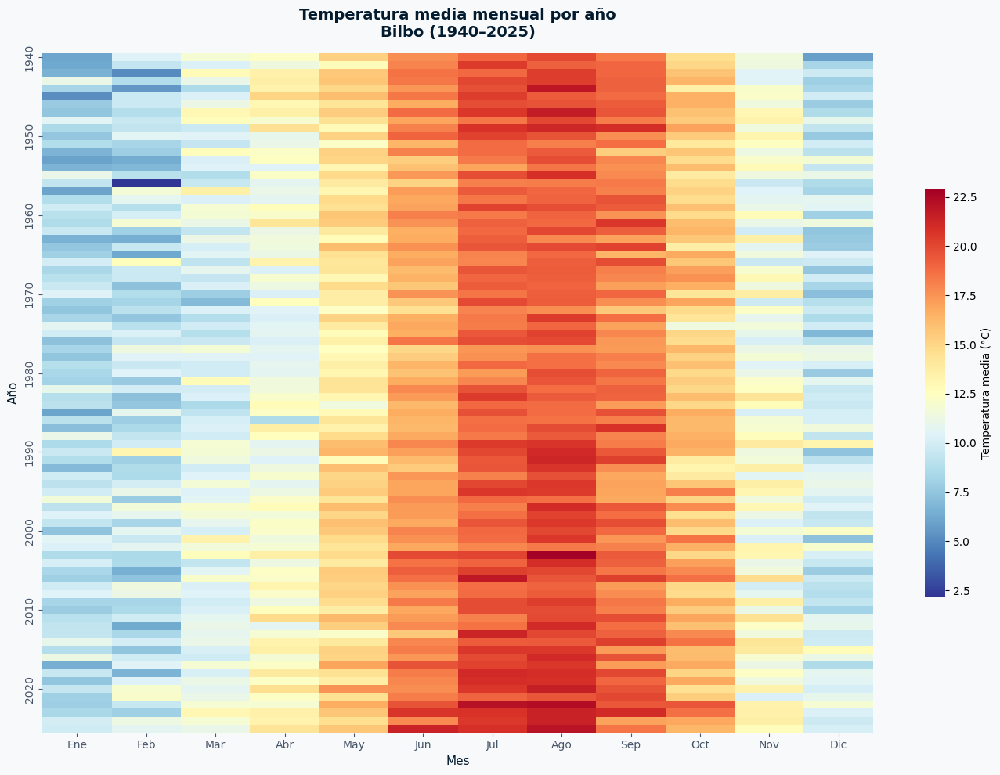

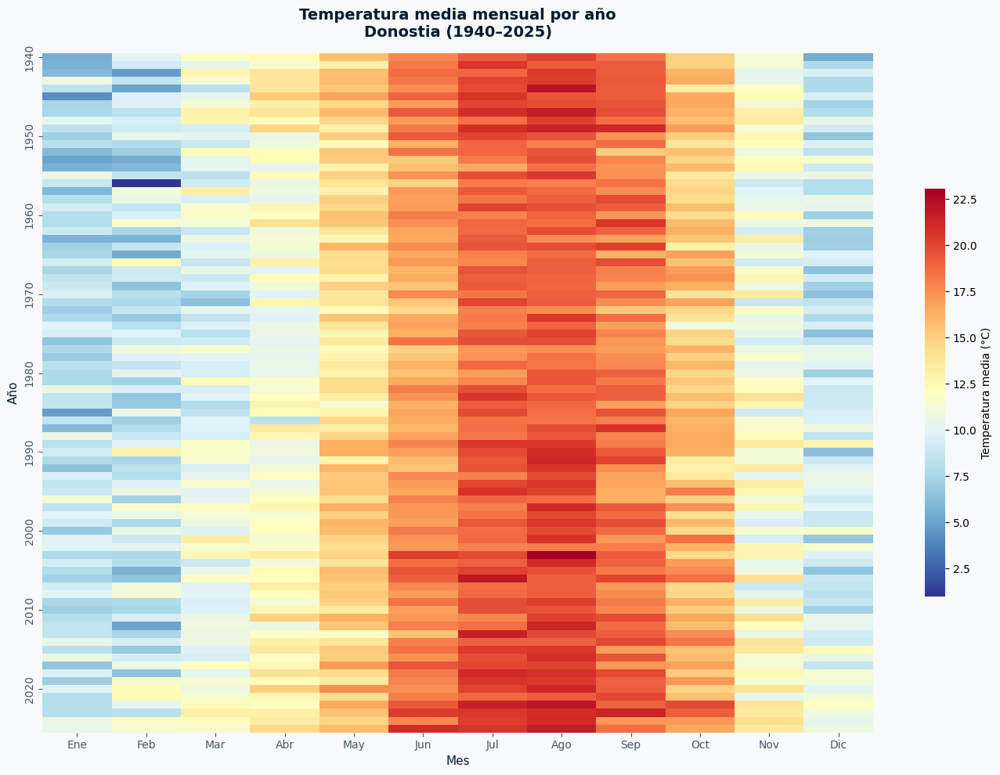

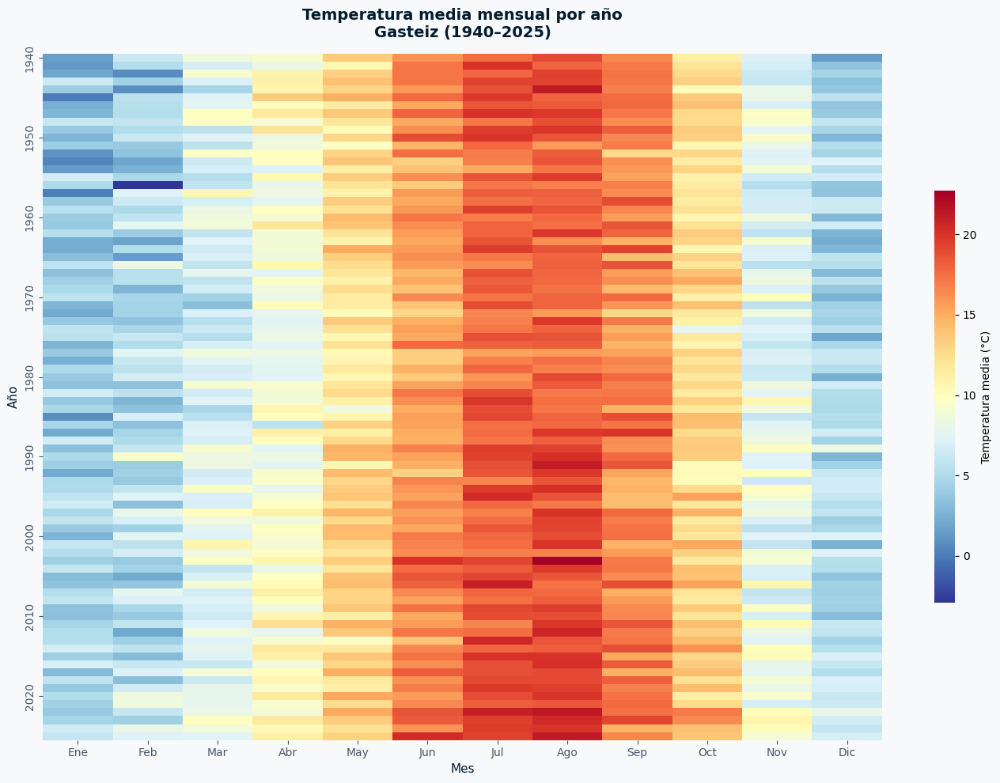

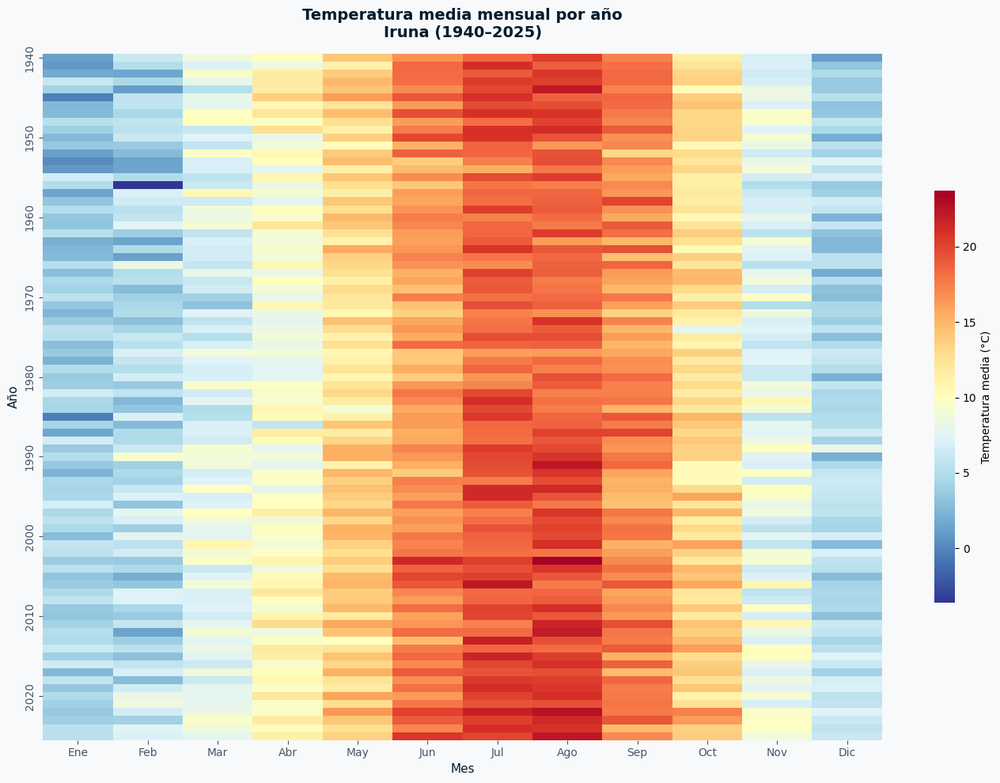

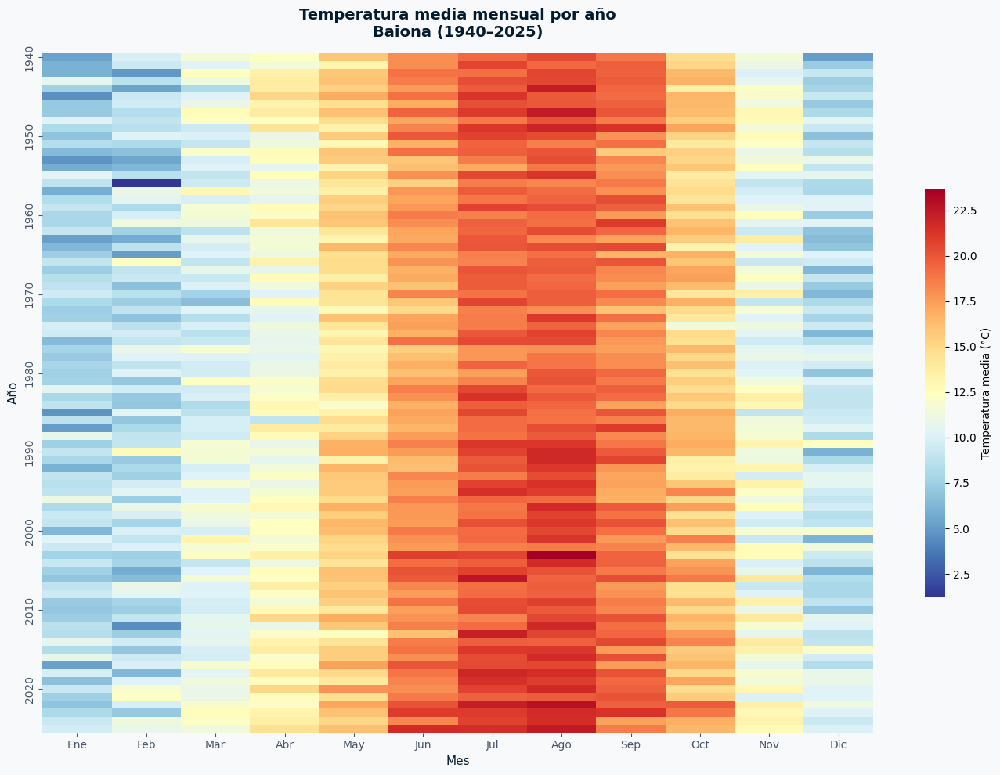

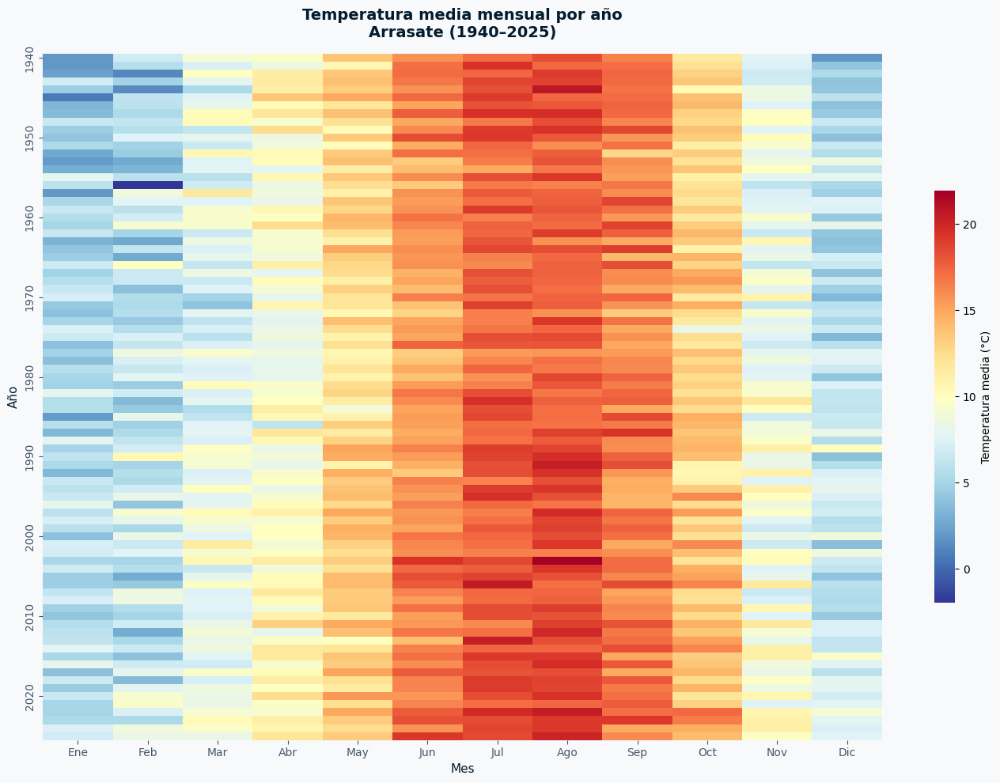

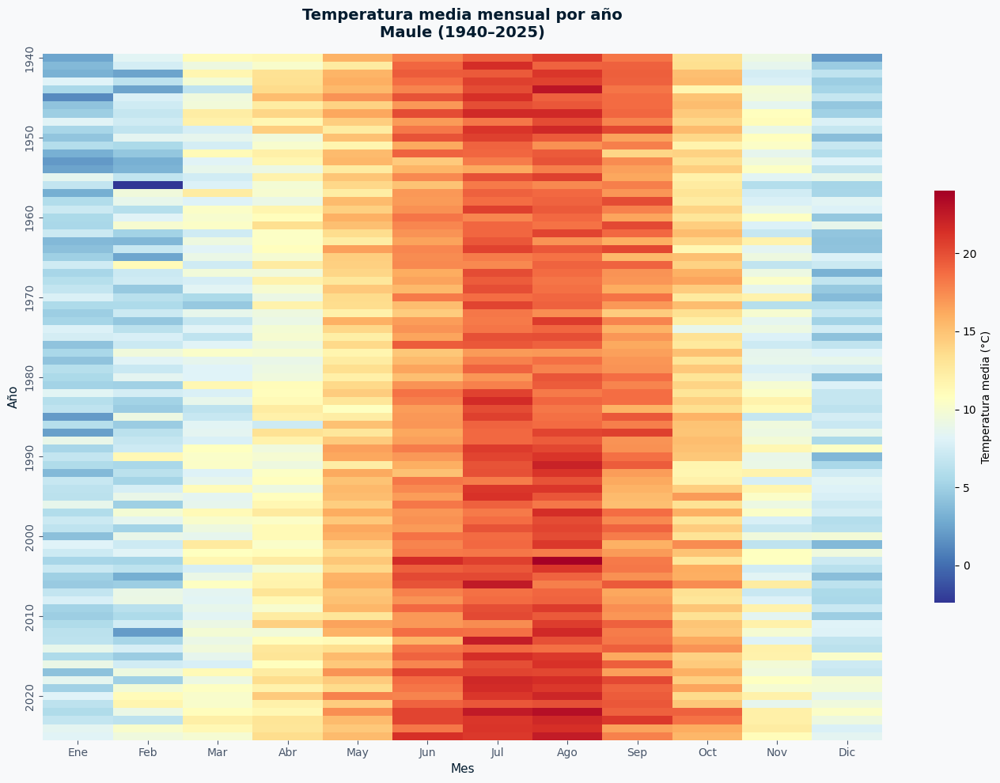

In [52]:
graficos_temp.graficar_heatmap_temp_mensual(CIUDADES)

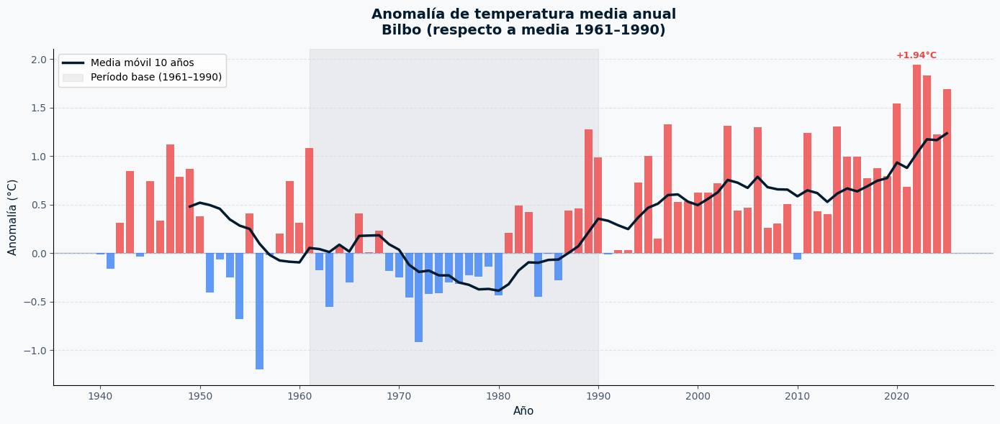

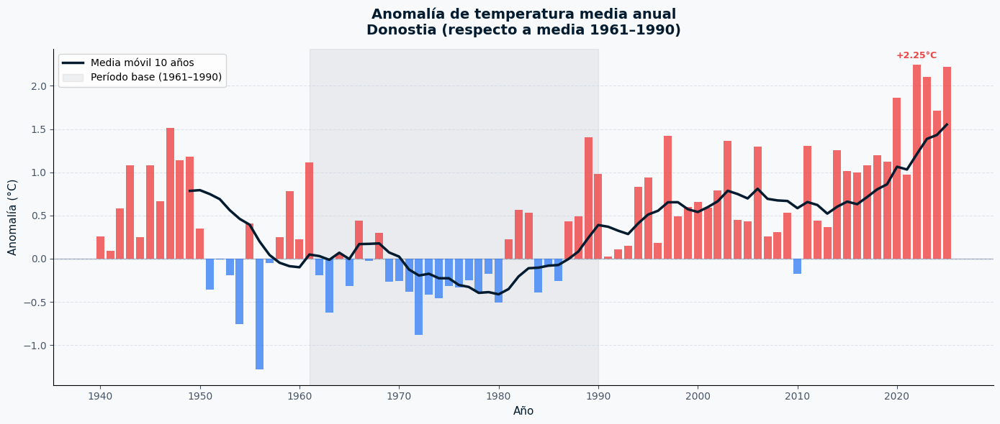

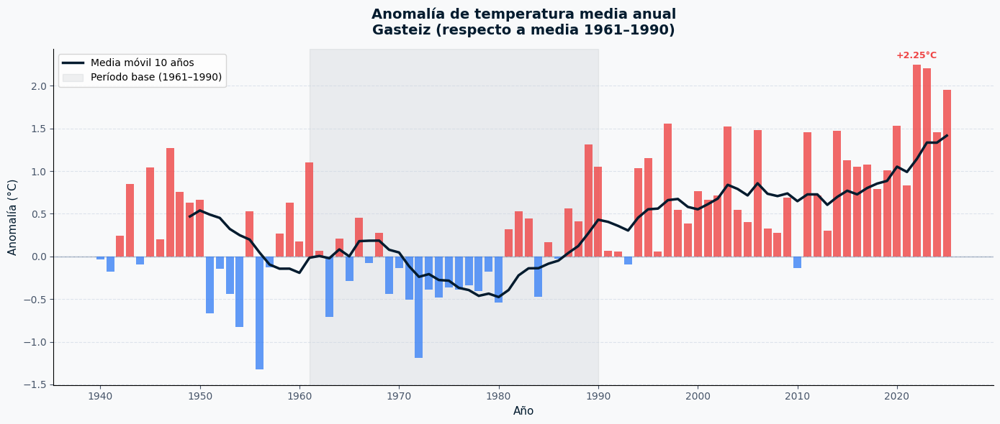

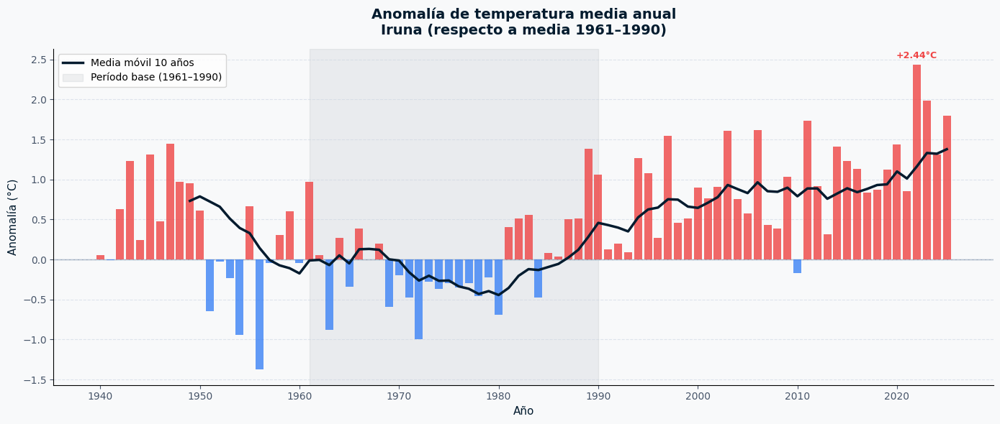

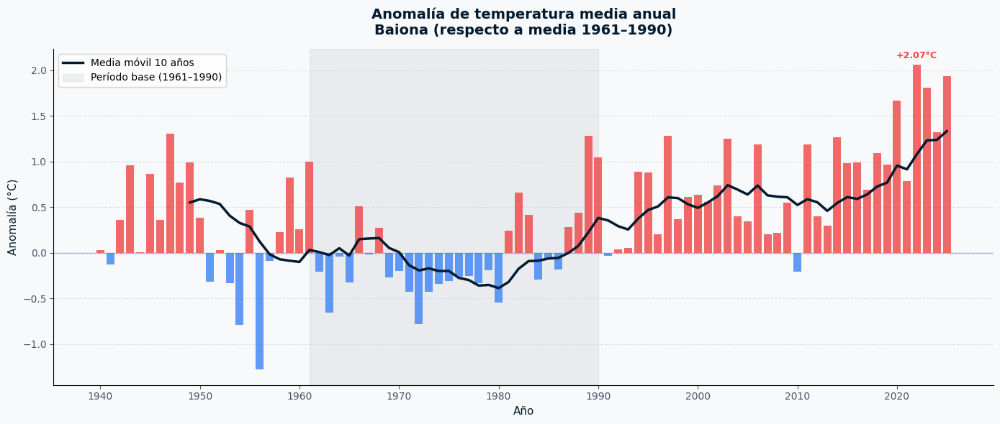

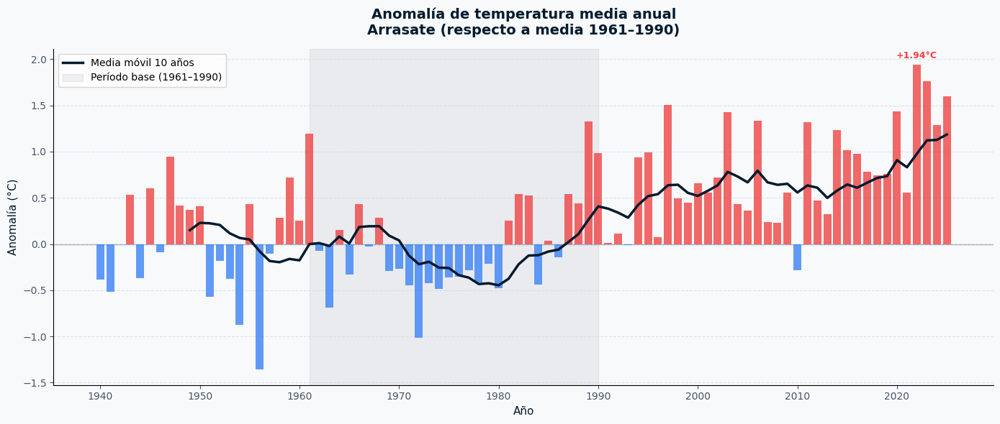

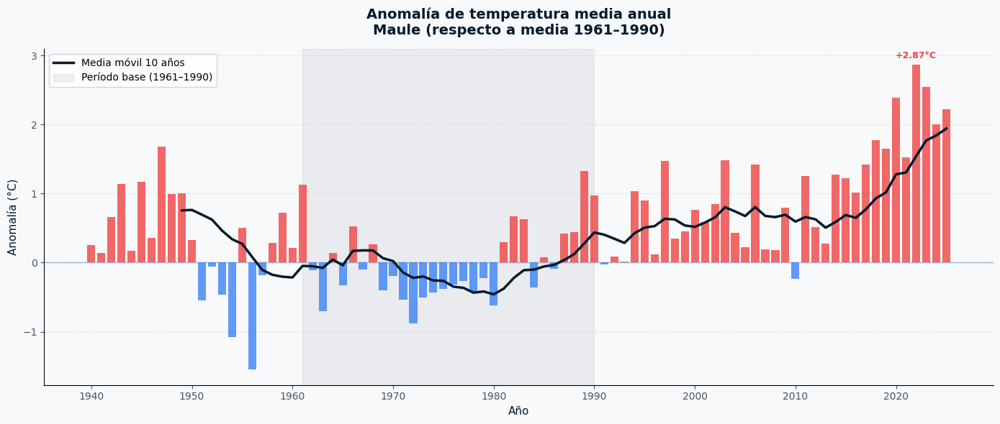

In [53]:
datos_anomalia = anomalia_termica.calcular_todos()
graficos_anomalia.graficar_anomalia(datos_anomalia)

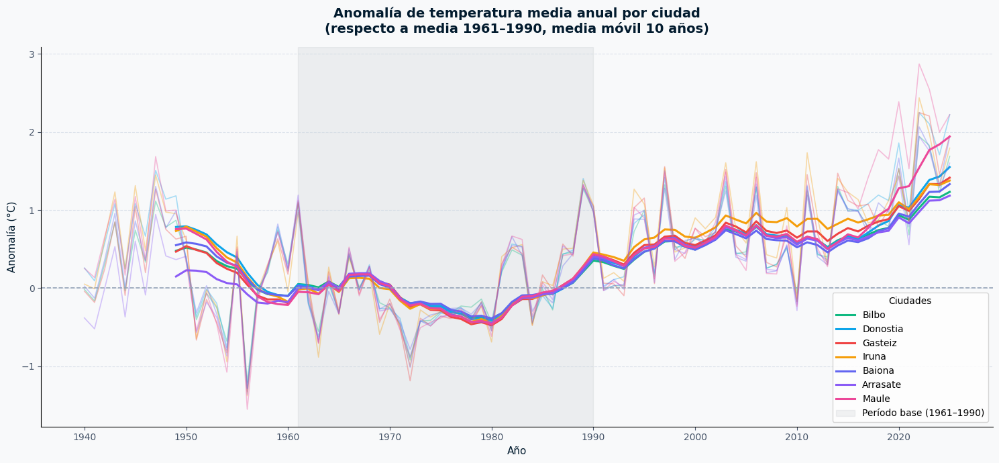

In [54]:
graficos_anomalia.graficar_anomalia_comparativa(datos_anomalia)

#### Resultados H1

Los gráficos de temperatura media anual muestran una tendencia lineal ascendente en todas las ciudades, con tasas que oscilan entre **+0,13°C/década** en las costeras (Bilbo, Donostia, Baiona) y **+0,16–0,17°C/década** en las ciudades de interior (Arrasate, Gasteiz, Maule). Los máximos históricos se registran en los años más recientes: Bilbo 15,6°C, Donostia 15,6°C, Gasteiz 13,0°C, Iruna 13,5°C, Arrasate 13,2°C, Baiona 15,7°C y Maule 15,2°C.

Los heatmaps mensuales confirman que el calentamiento no se distribuye de forma uniforme: los meses de **junio–agosto** muestran el desplazamiento más visible hacia tonos más cálidos en las décadas recientes, especialmente a partir de 2015.

El gráfico comparativo de anomalías revela **dos fases claramente diferenciadas**:

- **Fase 1 — Calentamiento gradual de la media (1980–2014):** la media móvil empieza a subir de forma sostenida, los años fríos prácticamente desaparecen, y las anomalías positivas se vuelven dominantes desde mediados de los 90. Es un calentamiento progresivo y relativamente regular.
- **Fase 2 — Aceleración de los extremos (2015–2025):** la pendiente de la media móvil se empina notablemente. Las anomalías alcanzan valores sin precedente en la serie histórica. Los máximos registrados respecto al período base 1961–1990 son: Bilbo +1,94°C, Donostia +2,25°C, Gasteiz +2,25°C, Iruna +2,44°C y Maule +2,87°C, todos ellos concentrados en el tramo 2020–2025.

#### Conclusión H1

> ✅ **H1 se confirma**, con una lectura en dos fases:
>
> - **1980–1990** marca el punto de inflexión de la tendencia de fondo: la media móvil empieza a subir de forma sostenida, los años fríos desaparecen y las anomalías positivas pasan a ser la norma. Es el inicio del calentamiento estructural de la temperatura media.
>
> - **2015–2020** marca una segunda ruptura, más visible en los extremos que en la media: los umbrales de calor que antes eran excepcionales (Tmax >30°C, >35°C, olas de calor) se disparan en todas las ciudades. La velocidad de cambio en este tramo es claramente mayor que en cualquier período anterior de la serie.
>
> Son dos fenómenos distintos: el primero es el calentamiento gradual de la media, el segundo es la explosión de los extremos. Ambos son necesarios para entender la señal climática completa de los 85 años analizados.

---

### H2 — Reducción de precipitaciones y aumento de episodios intensos

**Hipótesis:** La precipitación acumulada anual muestra una tendencia decreciente, especialmente en el interior, mientras los episodios de lluvia intensa y las rachas secas aumentan.

#### Metodología

El análisis se estructura en cuatro capas:

1. **Precipitación total anual** con media móvil de 10 años. Azul intenso (≥1400 mm), azul claro (1000–1399 mm), rosa/rojo (<1000 mm).
2. **Días con precipitación intensa (>30 mm/día)** — detecta si la lluvia se concentra en menos eventos pero más violentos.
3. **Heatmap año × mes** — revela si hay meses que se están secando sistemáticamente.
4. **Racha seca máxima anual** (días consecutivos con precipitación <1 mm) — captura la duración de los períodos secos, que el total anual no refleja.

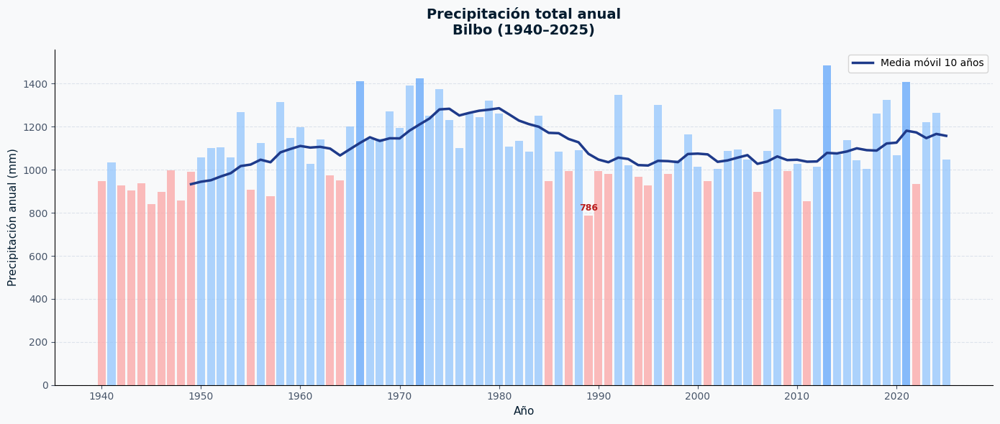

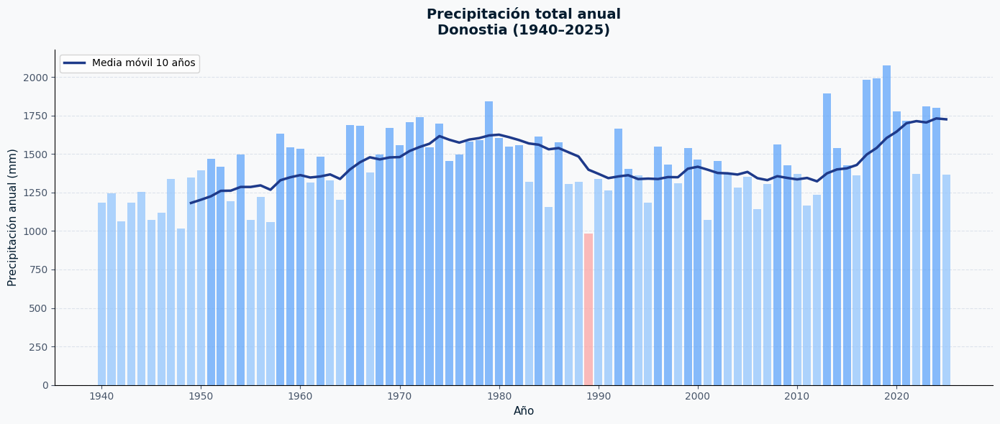

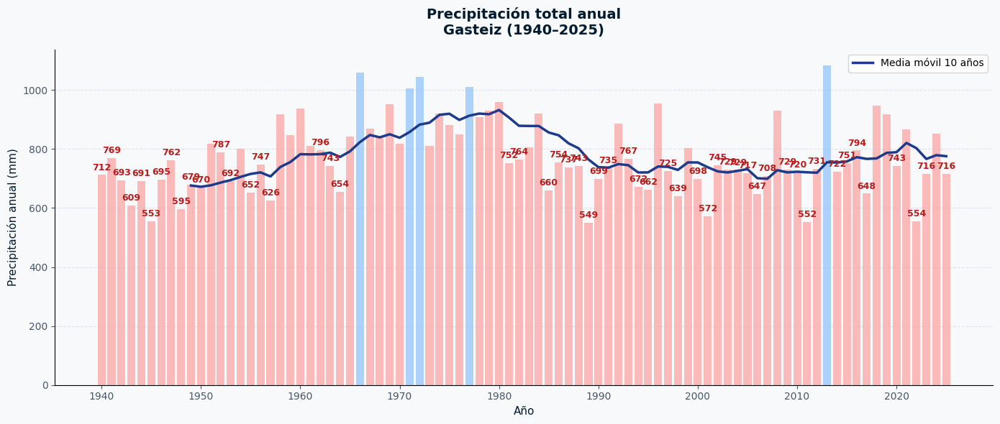

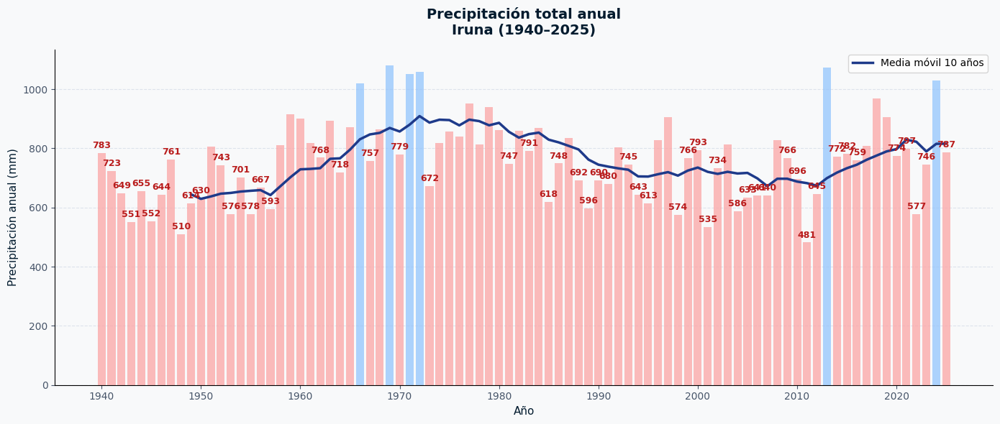

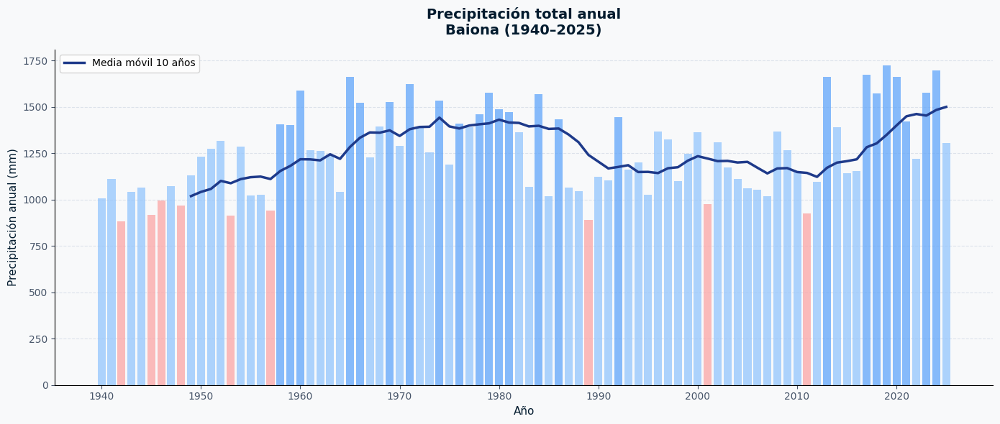

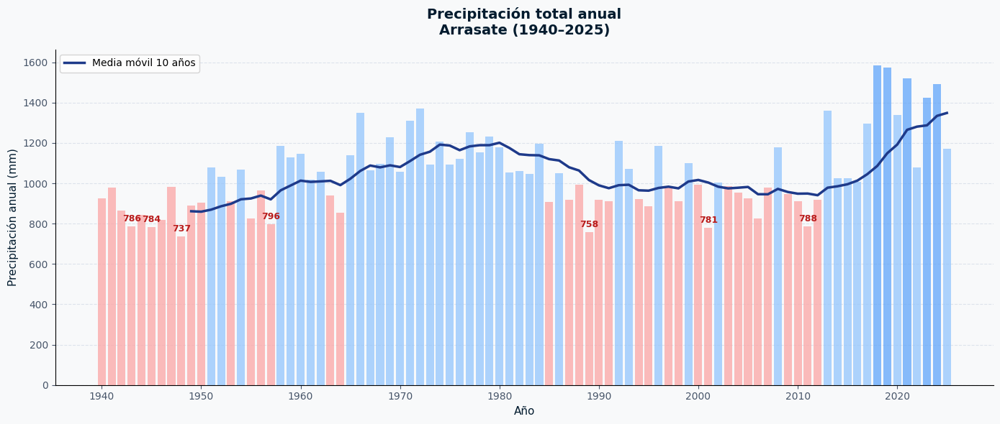

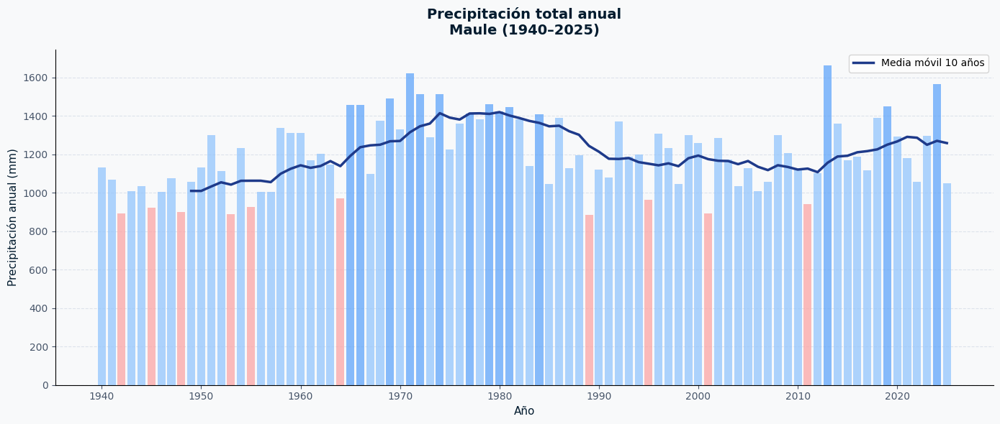

In [55]:
datos_precip = precipitaciones.calcular_todos()
graficos_precip.graficar_precipitacion_anual(datos_precip['precip_anual'])

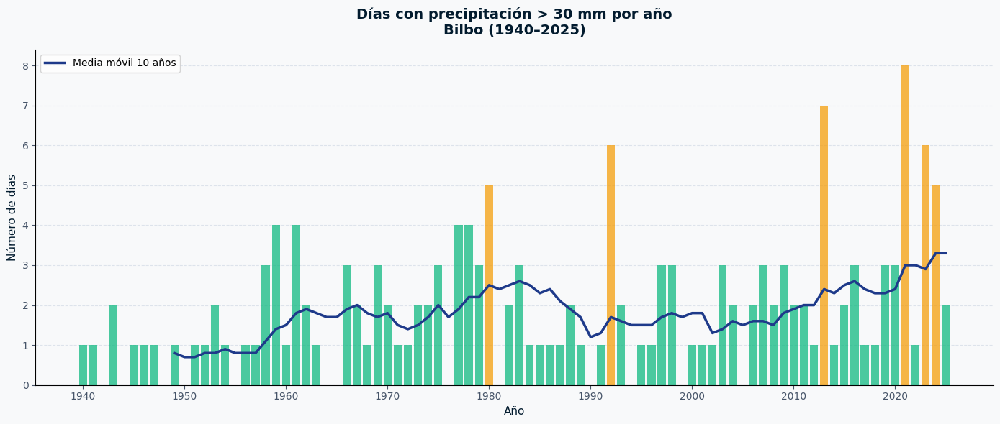

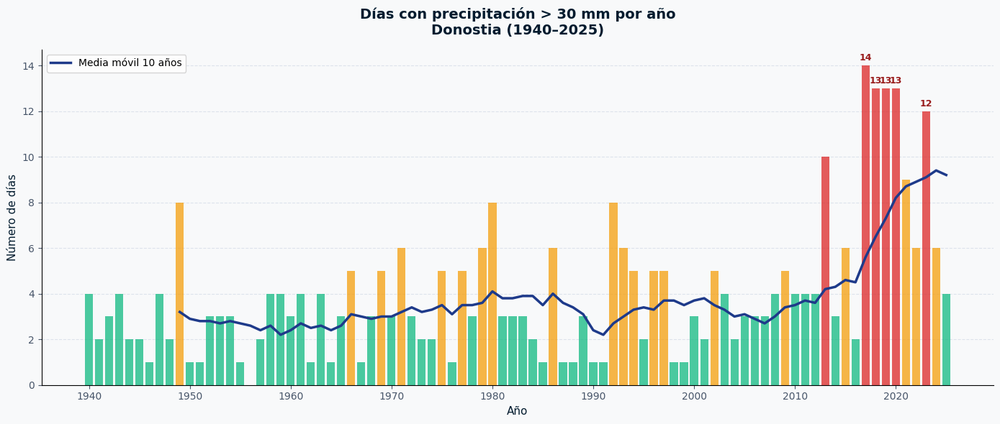

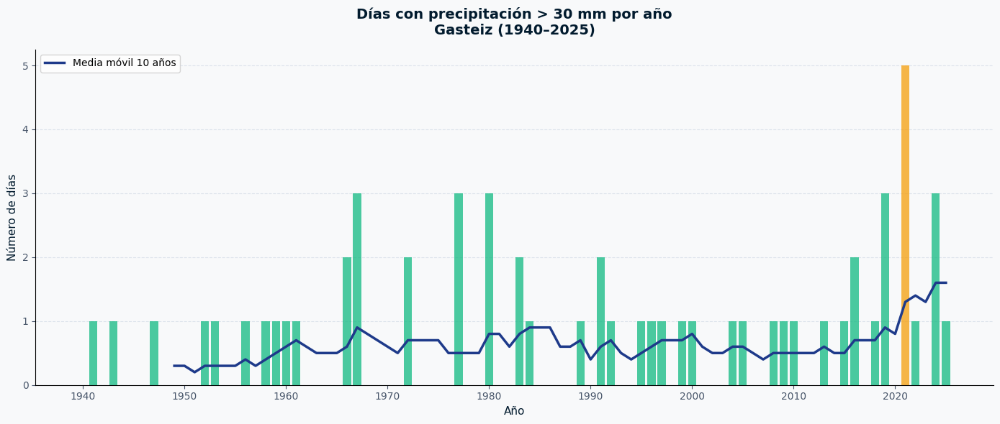

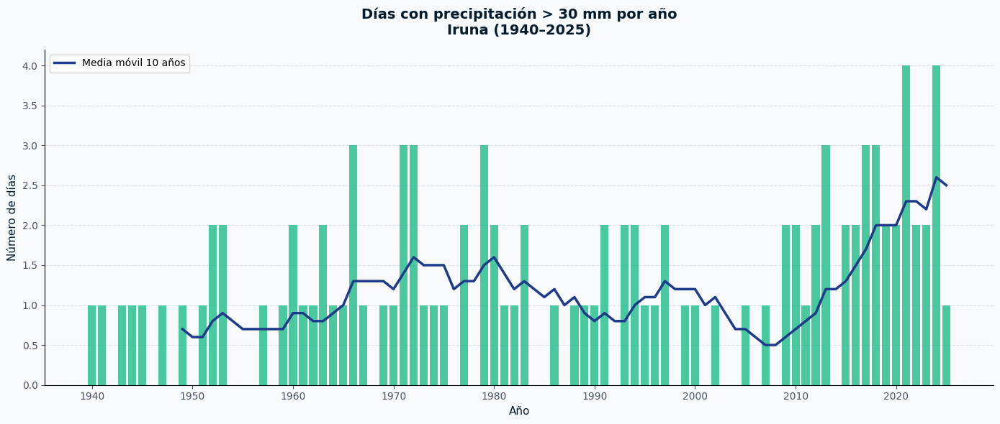

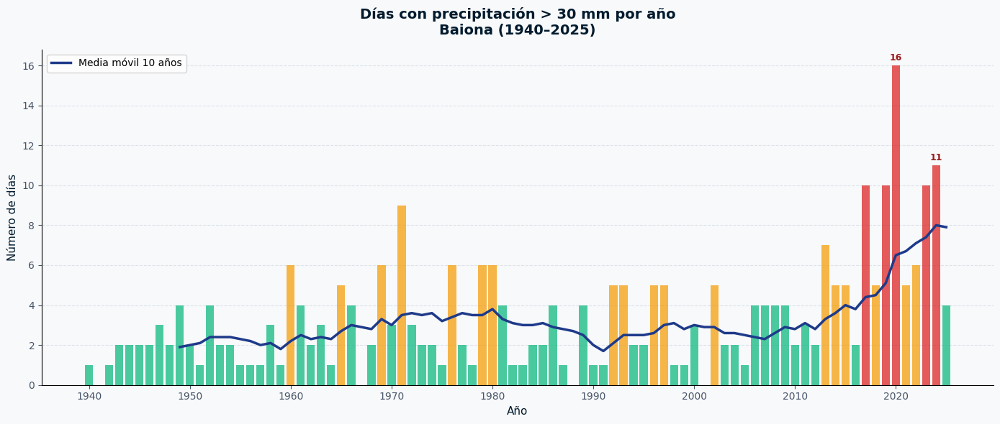

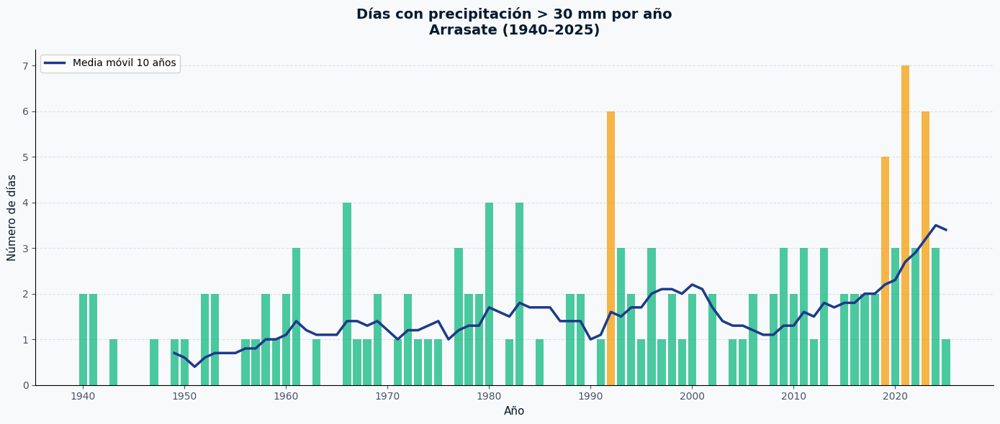

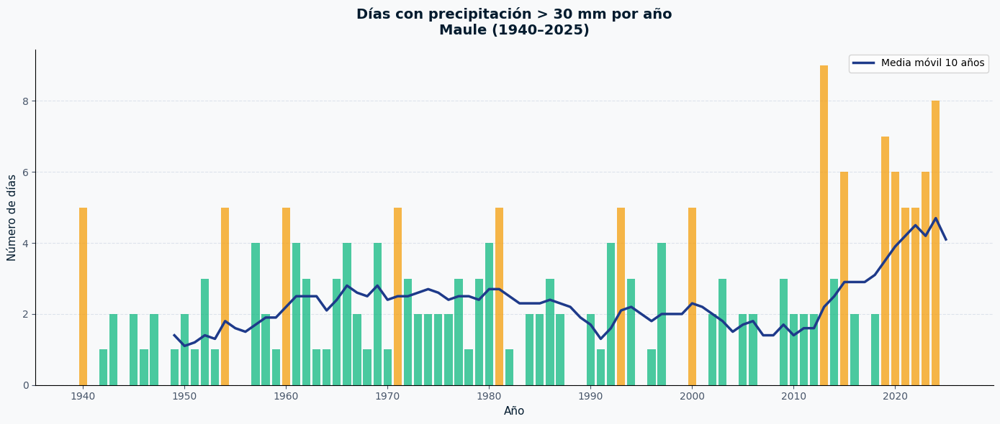

In [56]:
graficos_precip.graficar_dias_intensos(datos_precip['dias_intensos'])

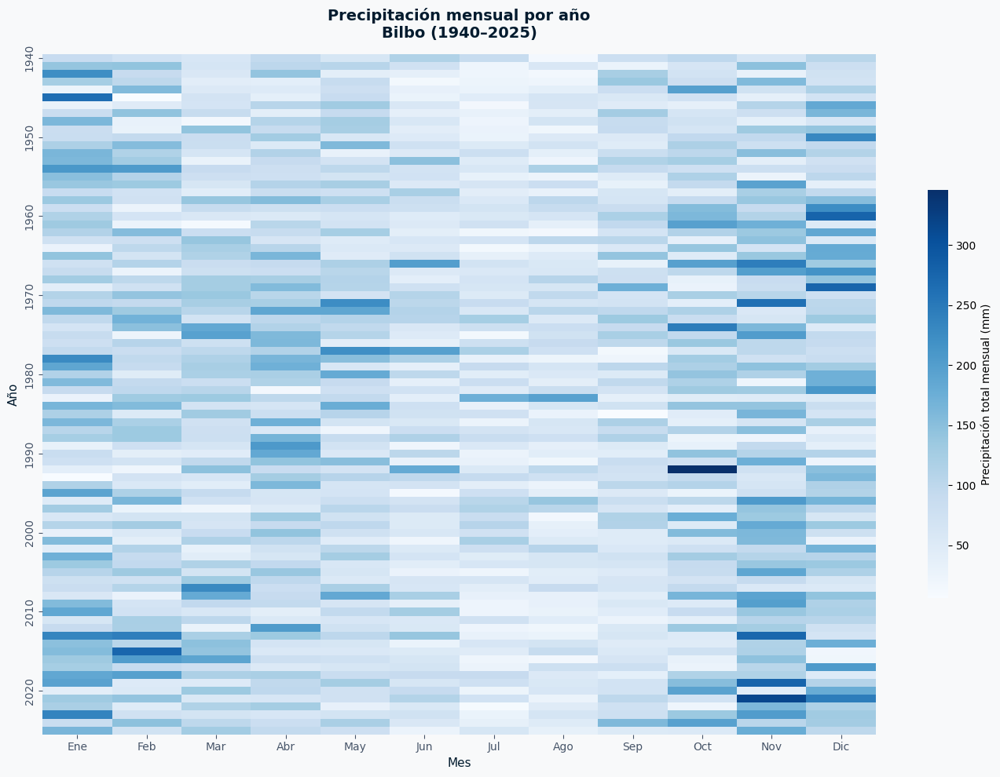

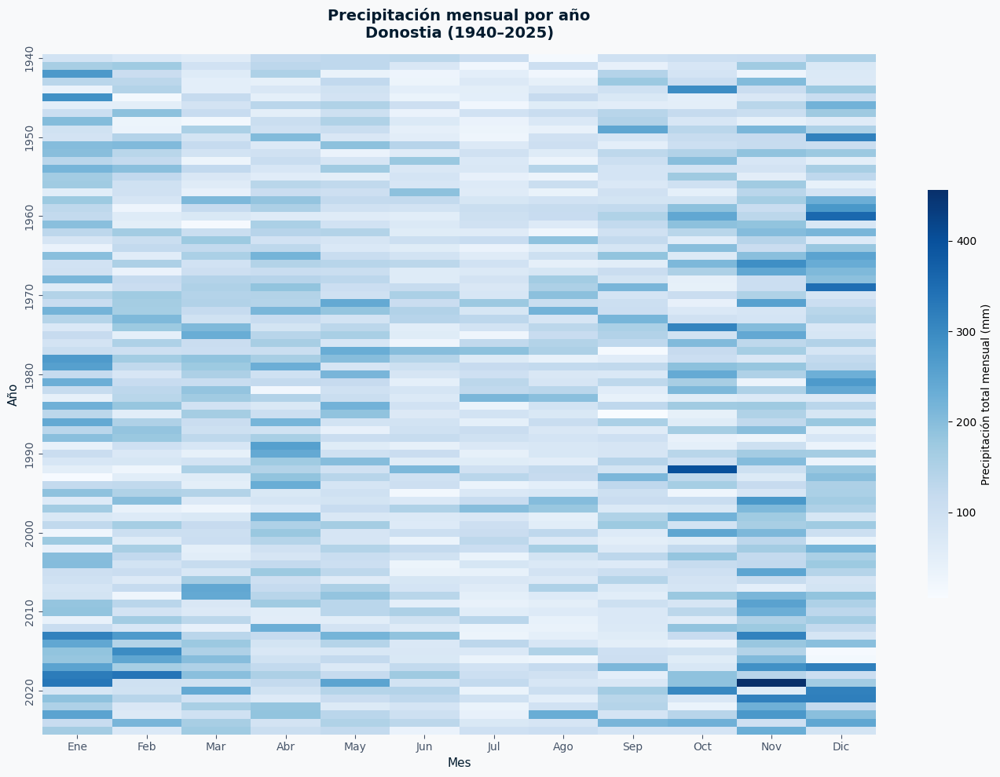

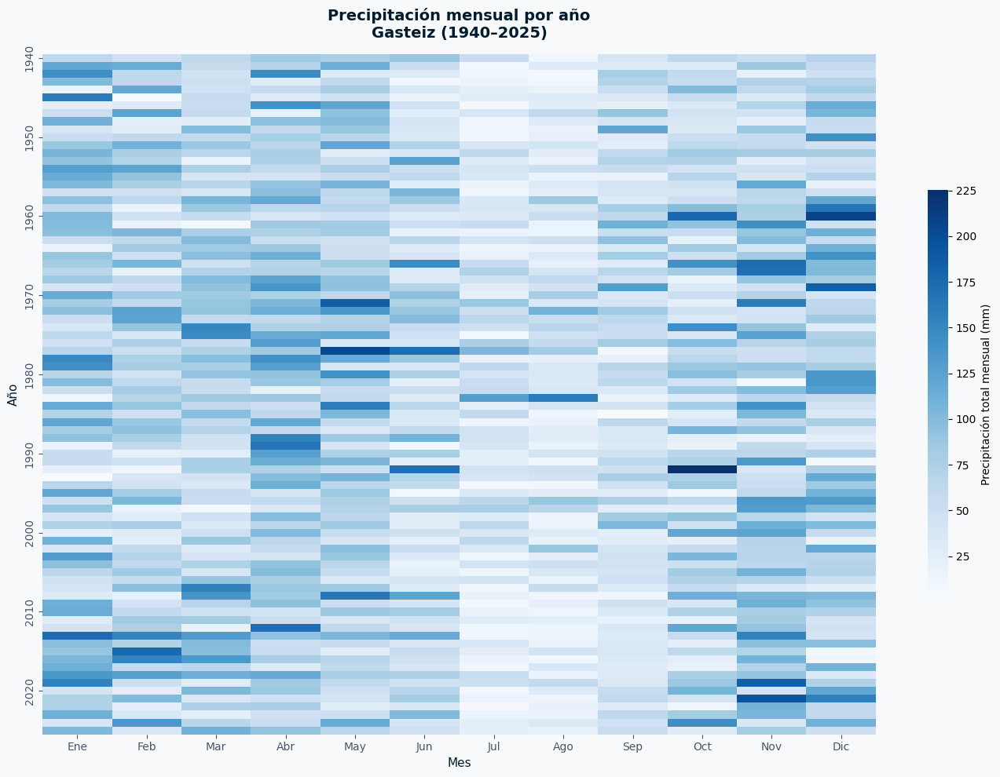

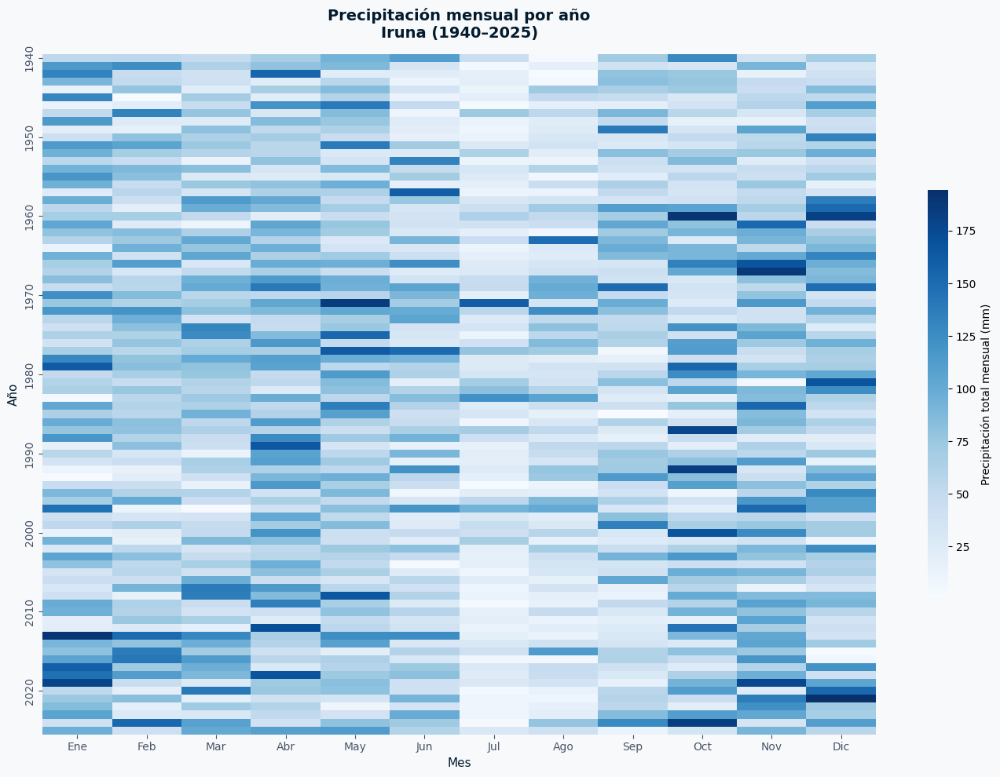

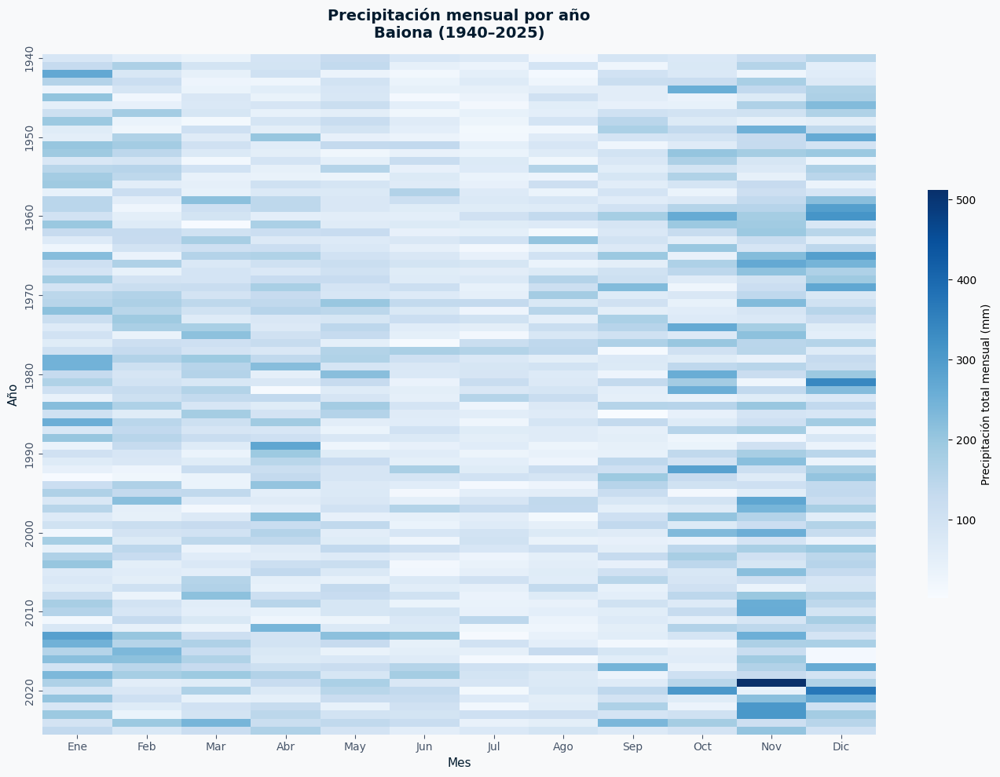

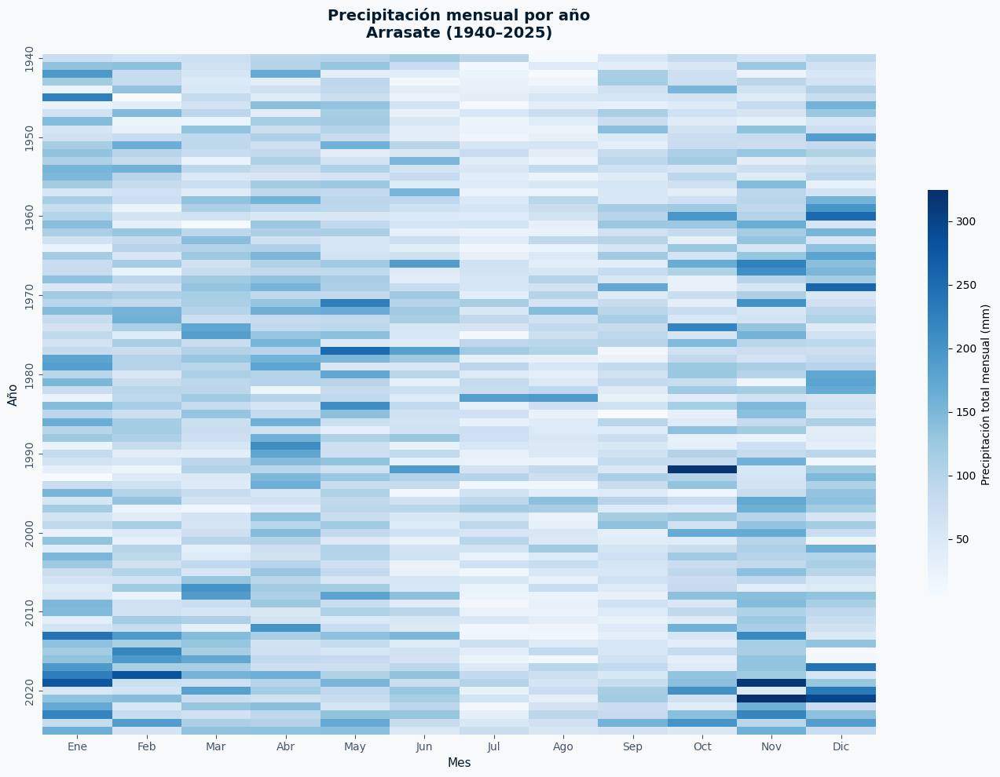

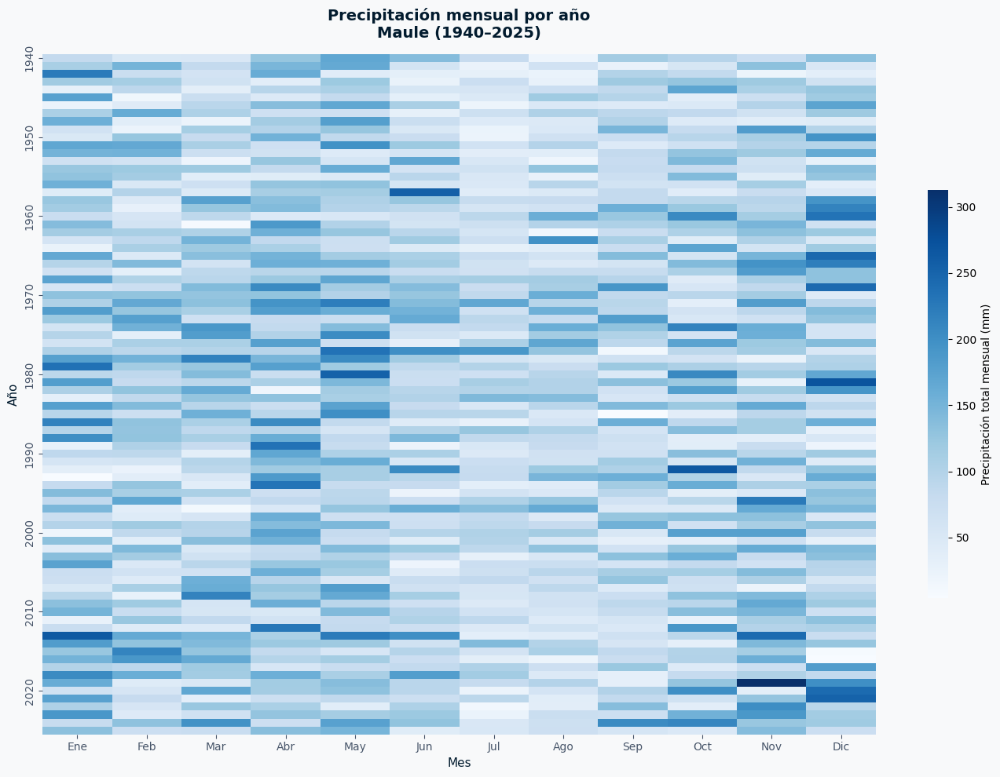

In [57]:
graficos_precip.graficar_heatmap_precip_mensual(CIUDADES)

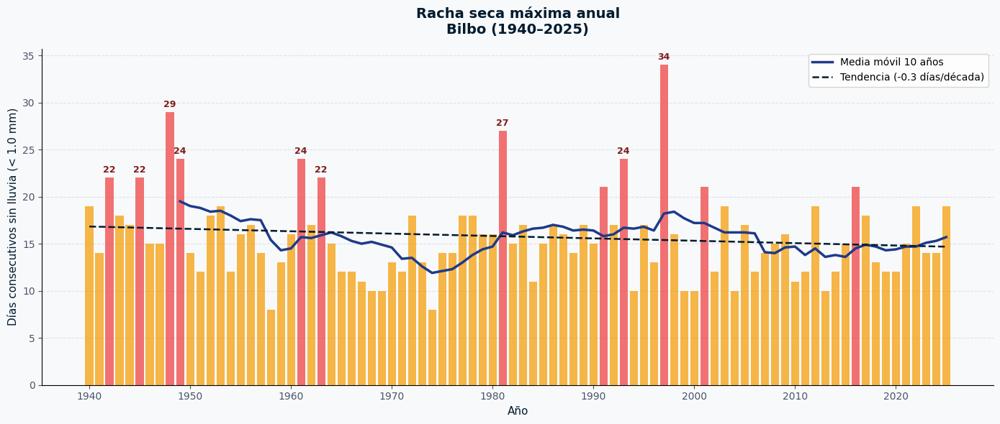

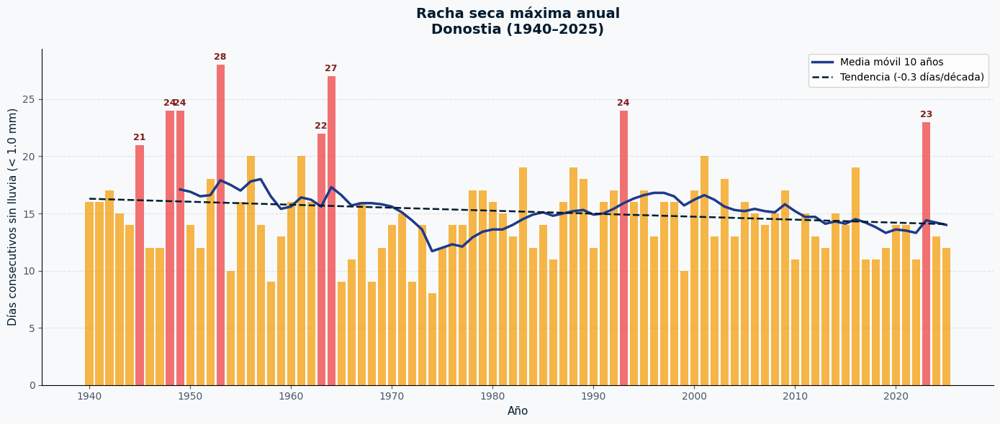

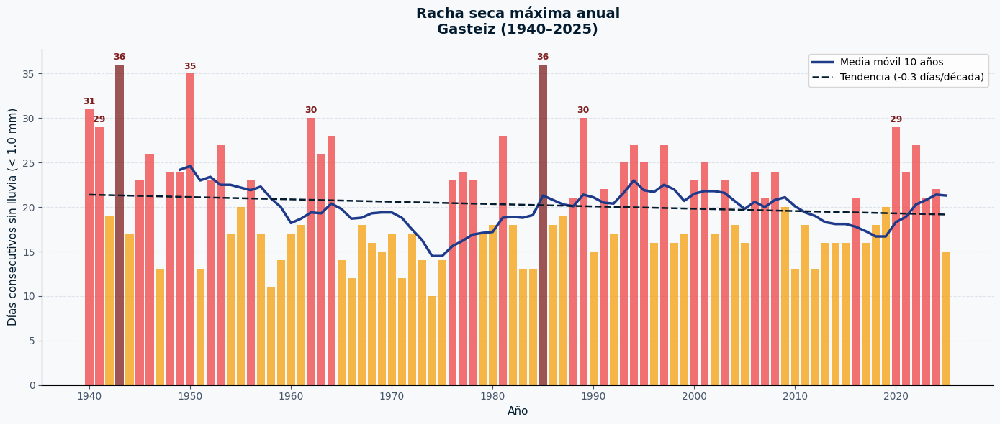

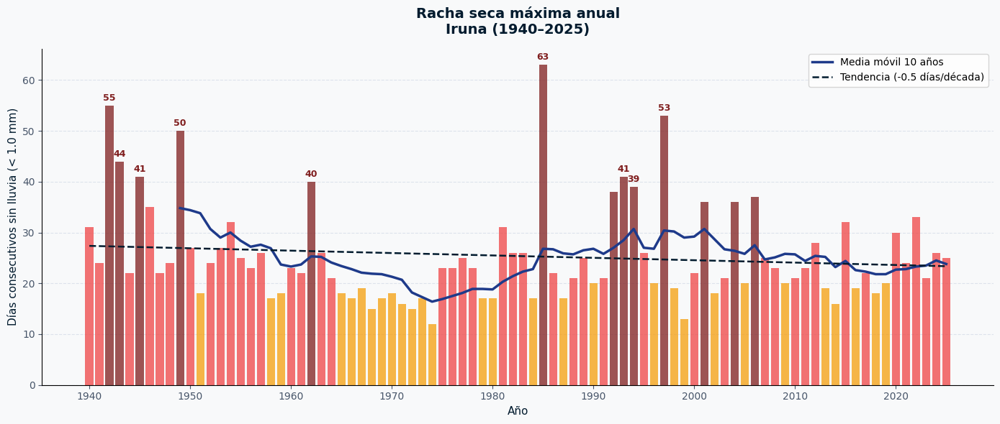

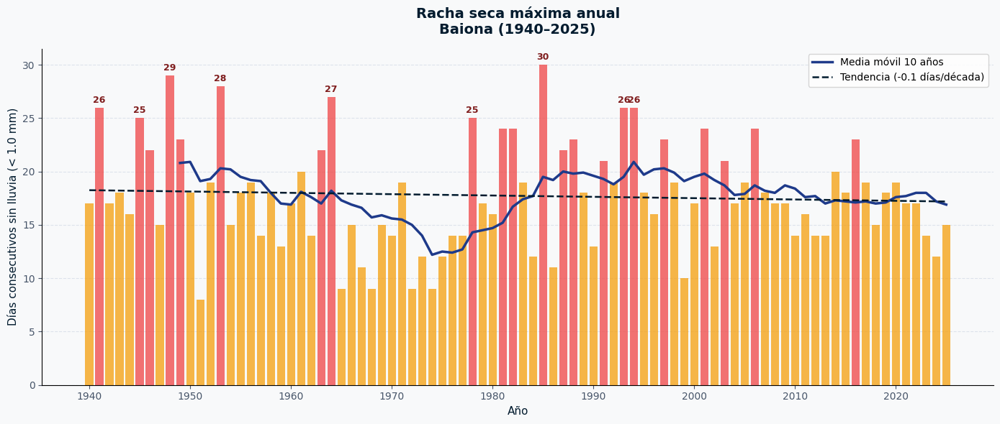

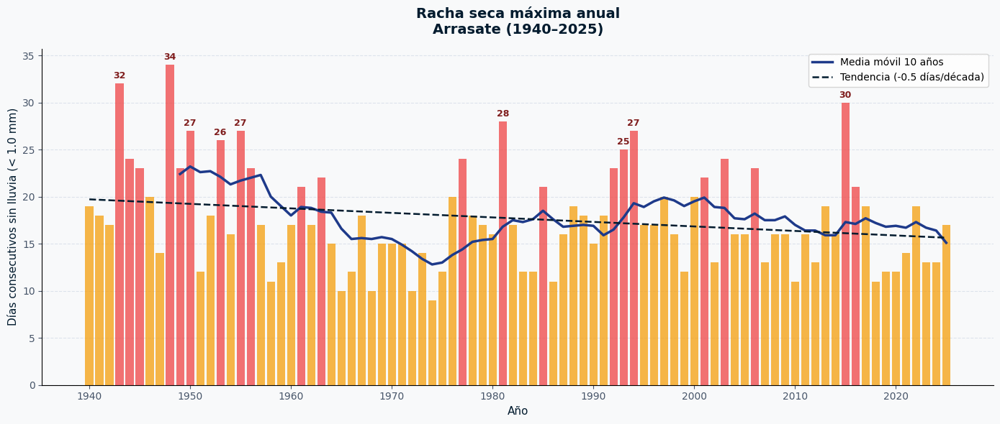

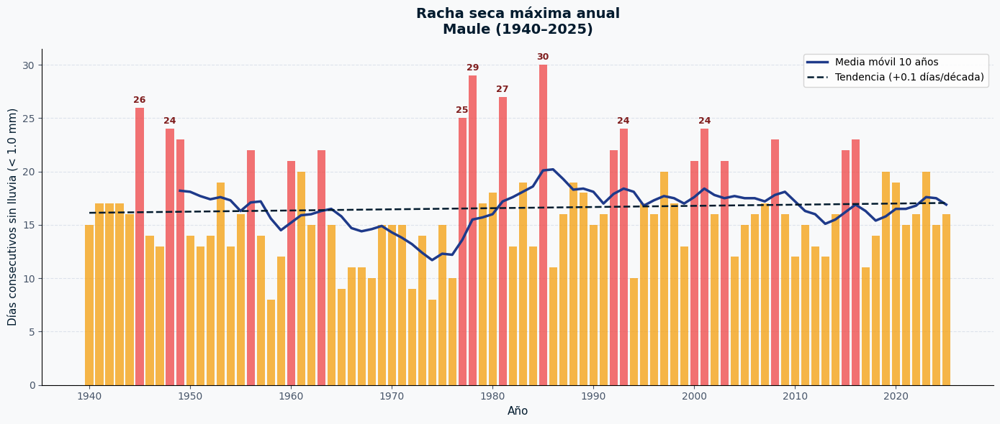

In [58]:
datos_racha = racha_seca.calcular_todos()
graficos_racha_seca.graficar_racha_seca(datos_racha)

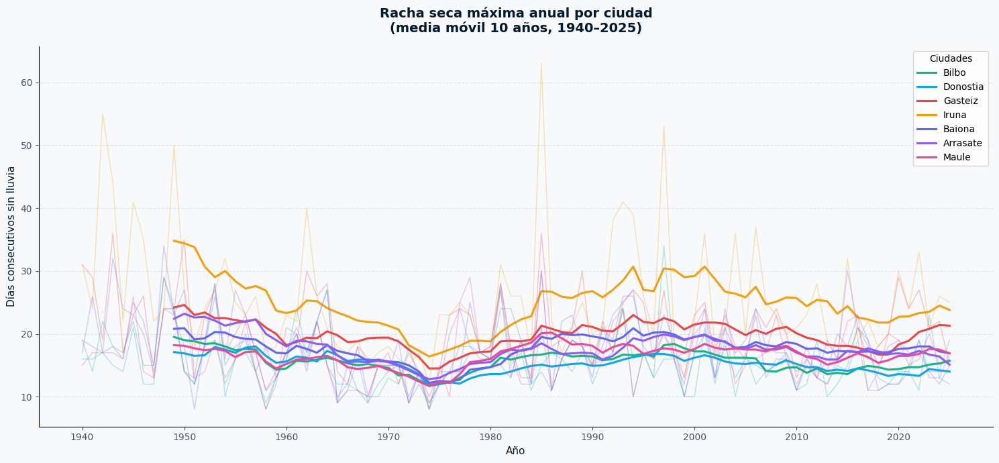

In [59]:
graficos_racha_seca.graficar_racha_comparativa(datos_racha)

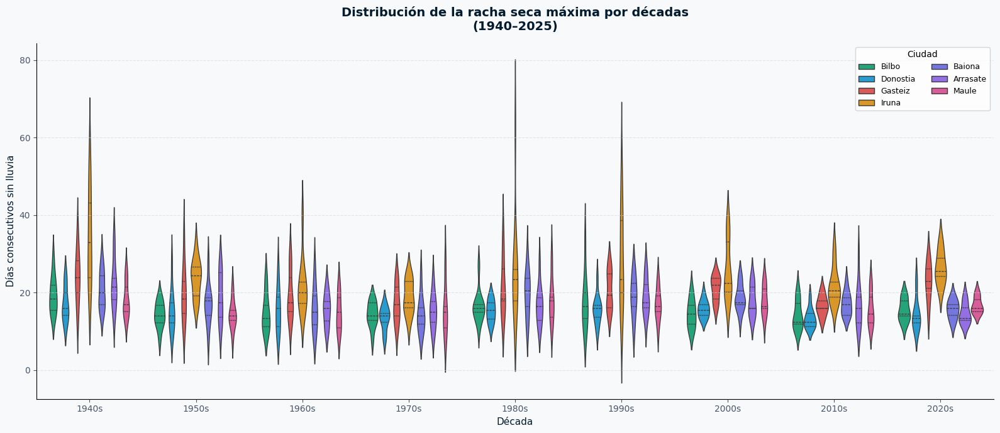

In [60]:
graficos_racha_seca.graficar_violin_rachas_decadas(CIUDADES)

#### Resultados H2

La precipitación anual muestra patrones distintos según la ubicación:
- **Ciudades costeras** (Donostia: ~1.200–1.800 mm, Baiona: ~1.000–1.700 mm, Bilbo: ~900–1.400 mm) presentan valores elevados sin tendencia descendente clara. Donostia destaca con mínimos históricos en 1989 (~985 mm) y máximos recientes superando 2.000 mm.
- **Ciudades del interior** (Gasteiz: ~550–1.000 mm, Iruna: ~480–1.080 mm) muestran una media móvil con descenso progresivo desde los máximos de los años 70. Gasteiz registró su mínimo histórico de 549 mm en 1991, con una tendencia de fondo claramente descendente.

Las **rachas secas máximas** evidencian diferencias importantes: Bilbo muestra tendencia de -0,3 días/década (leve reducción, racha máxima: 34 días en 1997). Gasteiz presenta -0,3 días/década con rachas que alcanzan 36 días. Iruna es la más extrema: -0,5 días/década pero con rachas históricas de 55 días (1940) y 63 días (1985). Maule es la única con tendencia ligeramente positiva (+0,1 días/década), reflejando su carácter más continental. El violin plot por décadas confirma que las distribuciones se mantienen estables pero con mayor variabilidad en los extremos.

#### Conclusión H2

> ⚠️ **H2 se confirma parcialmente.** La evidencia es diferenciada según la variable analizada:
>
> - **Precipitación total:** la reducción es clara en ciudades del interior (Iruñea, Gasteiz, Maule), donde la media móvil muestra un descenso sostenido desde los máximos de los años 70–80. Las costeras (Donostia, Baiona) no muestran una tendencia tan nítida.
>
> - **Paradoja precipitación-intensidad:** aunque el total se reduce o mantiene, los episodios de lluvia intensa (>30 mm/día) han aumentado en todas las ciudades en la última década, reflejando una concentración de la precipitación en menos días pero de mayor intensidad.
>
> - **Racha seca:** el indicador más revelador. Todas las ciudades muestran una tendencia creciente en la racha seca máxima, especialmente visible desde los años 2000. Las ciudades del interior superan con frecuencia los 40 días consecutivos sin lluvia en años recientes.

---

### H3 — Diferencias climáticas entre ciudades

**Hipótesis:** Las ciudades del interior presentan mayor variabilidad térmica, calentamiento más intenso y un perfil climático sistemáticamente distinto al de las ciudades costeras.

#### Metodología

Se emplean tres niveles de análisis, de lo descriptivo a lo multivariante:

1. **Series temporales comparativas** de temperatura media anual y precipitación — permite visualizar la brecha entre ciudades a lo largo del período completo.
2. **Violinplot de temperatura diaria** — muestra la distribución completa, no solo la media, poniendo de manifiesto la mayor variabilidad del interior.
3. **Clustering jerárquico (Ward)** sobre 10 variables estandarizadas — agrupa las ciudades por similitud de perfil climático completo de forma objetiva, sin presuponer los grupos. El heatmap del perfil (clustermap) muestra qué variables son responsables de cada agrupación.

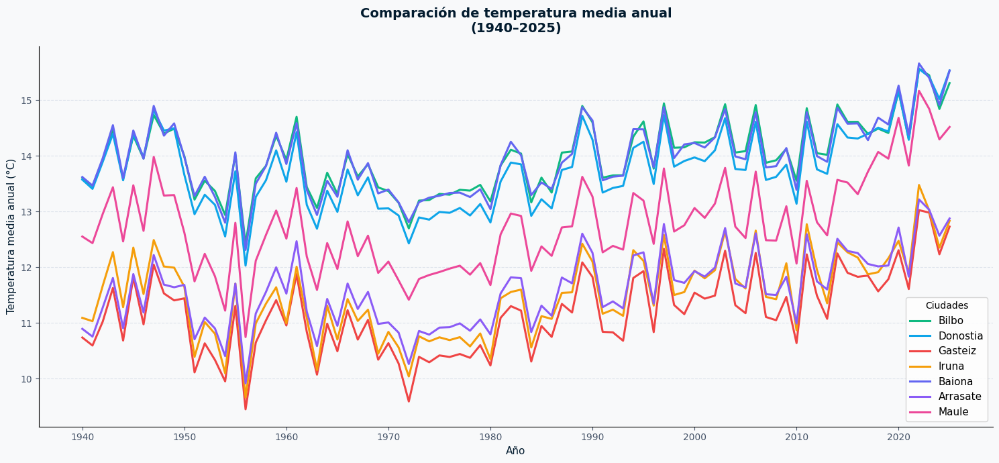

In [61]:
datos_estac = estacionalidad.calcular_todos()
graficos_estacionalidad.graficar_comparativa_ciudades(datos_estac['comp_temp'])

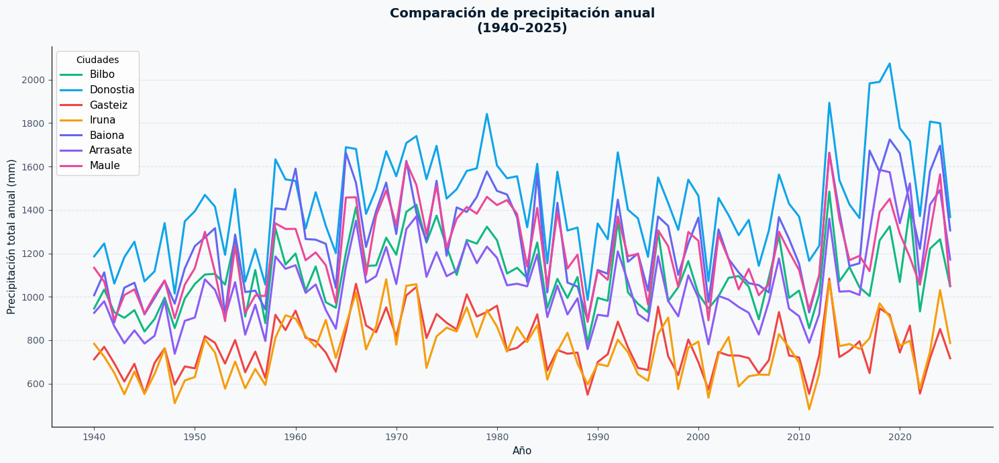

In [62]:
graficos_estacionalidad.graficar_comparativa_ciudades(datos_estac['comp_precip'])

/Users/nora/Documentos_Clase/BOOTCAMP/EDA/scripts/graficos/graficos_estacionalidad.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


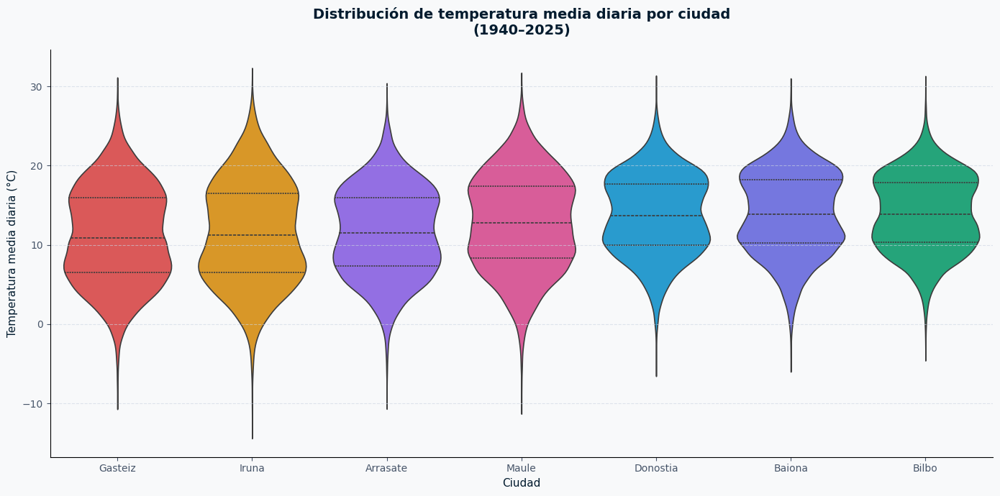

In [63]:
graficos_estacionalidad.graficar_violin_ciudades(CIUDADES)

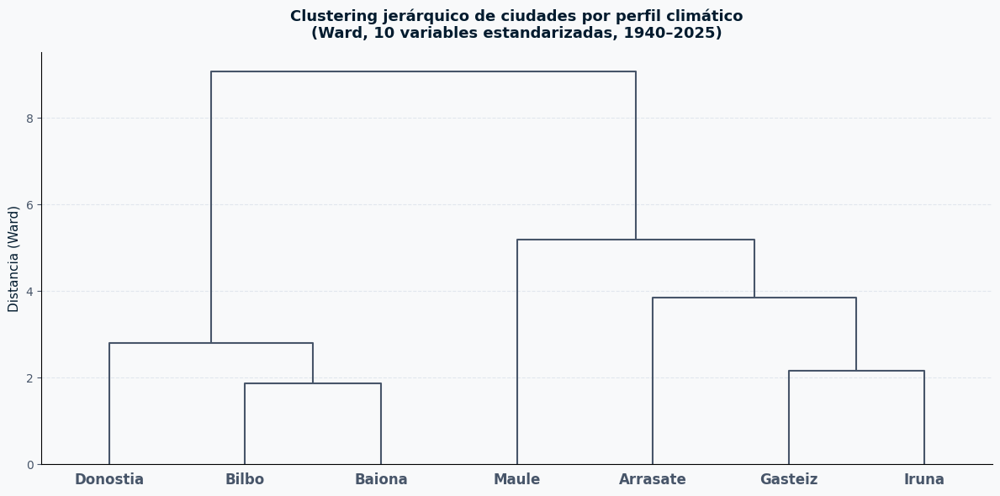

In [64]:
datos_cluster = clustering_ciudades.calcular_todos()
graficos_clustering.graficar_dendrograma(datos_cluster)

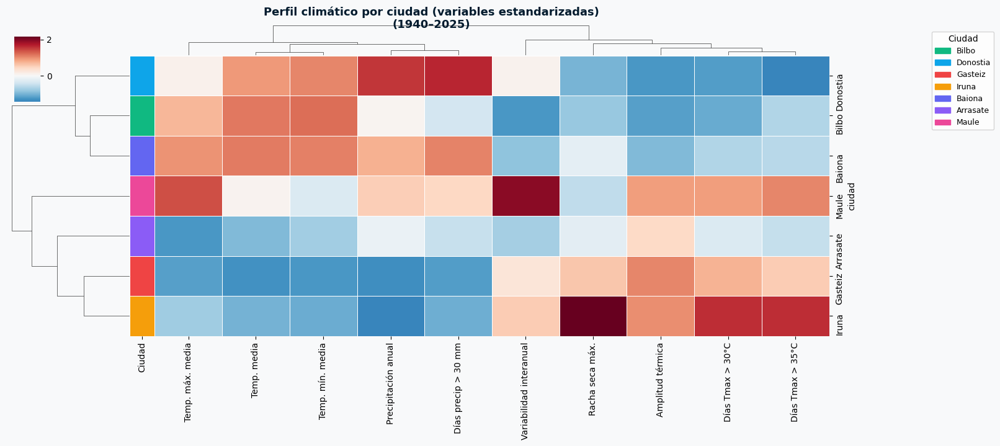

In [65]:
graficos_clustering.graficar_heatmap_perfil(datos_cluster)

#### Resultados H3

La comparativa de temperatura media anual confirma dos grupos claramente separados a lo largo de todo el período:
- **Grupo costero** (Bilbo, Donostia, Baiona): rango 13–15,7°C, evolución paralela y coherente.
- **Grupo interior** (Gasteiz, Iruna, Arrasate, Maule): rango 9–13,5°C, mayor variabilidad y mayor pendiente de calentamiento.

El **violinplot de temperatura media diaria** confirma las diferencias: las ciudades interiores (Gasteiz, Iruna) presentan distribuciones más anchas con colas pronunciadas hacia valores extremos (tanto positivos como negativos). Gasteiz alcanza valores mínimos de hasta -10°C, mientras Donostia raramente baja de -5°C. Iruna muestra la distribución más asimétrica con cola superior extendida hacia 30°C.

El **dendrograma de clustering** separa con claridad dos clústeres: (1) Donostia–Bilbo–Baiona y (2) Maule–Arrasate–Gasteiz–Iruna. Dentro del segundo, Gasteiz e Iruna forman un subgrupo por su similitud en días extremos y amplitud térmica. El heatmap del perfil climático normalizado muestra que las variables más discriminantes son precipitación anual, días con Tmax >35°C y racha seca máxima.

#### Conclusión H3

> ✅ **H3 se confirma.** Las diferencias entre ciudades son sistemáticas y consistentes en el tiempo:
>
> - Las ciudades costeras (Donostia, Bilbo, Baiona) forman un grupo climático coherente: temperaturas medias más altas, menor variabilidad interanual y precipitaciones más abundantes.
>
> - Las ciudades del interior (Gasteiz, Iruñea, Arrasate, Maule) presentan temperaturas medias más bajas, mayor amplitud térmica diaria y anual, más días con temperaturas extremas y rachas secas más largas.
>
> - El **dendrograma de clustering** separa de forma clara los dos grupos con alta distancia de Ward. El heatmap del perfil climático muestra que las variables más discriminantes son la precipitación anual, los días con Tmax >35°C y la racha seca máxima.
>
> - Arrasate ocupa una posición intermedia en el dendrograma, coherente con su ubicación geográfica en el corredor del Deba, a media distancia entre la costa y la meseta.

---

### H4 — Aumento en la frecuencia e intensidad de temperaturas extremas

**Hipótesis:** El número de días con Tmax >35°C ha aumentado notablemente desde los años 2000, con una explosión a partir de 2015–2020. En paralelo, los días con Tmin < 0°C han disminuido, indicando una atenuación de los inviernos fríos y una asimetría creciente entre extremos cálidos y fríos.

#### Metodología

Se distingue entre **frecuencia** (días aislados) e **intensidad** (episodios continuados), y entre **extremos cálidos** (Tmax >35°C) e **inviernos fríos** (Tmin <0°C):

1. **Días con Tmax >35°C por año** con media móvil de 10 años — indicador base del calentamiento extremo.
2. **Boxplot de Tmax por décadas** — muestra cómo se desplaza toda la distribución, no solo los extremos.
3. **Olas de calor** (≥3 días consecutivos con Tmax >35°C) — número de episodios y duración máxima por año.
4. **Calendario heatmap ciudad × año** — concentración visual de los episodios más extremos.

> 📌 **Nota metodológica:** el análisis de días con Tmin <0°C como indicador de atenuación de inviernos forma parte del planteamiento original de H4. Los heatmaps mensuales de temperatura (sección H1) permiten observar el calentamiento de los meses invernales, que es coherente con una reducción de los días bajo cero, aunque no se ha generado un gráfico específico para este indicador.

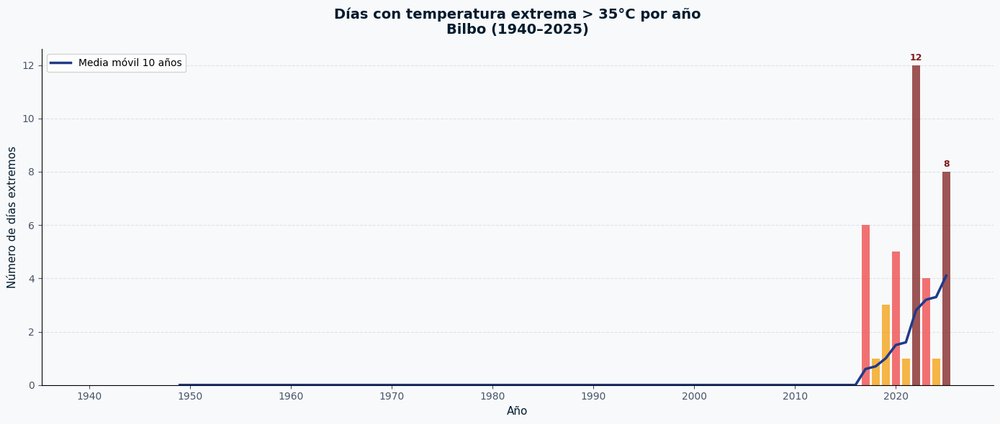

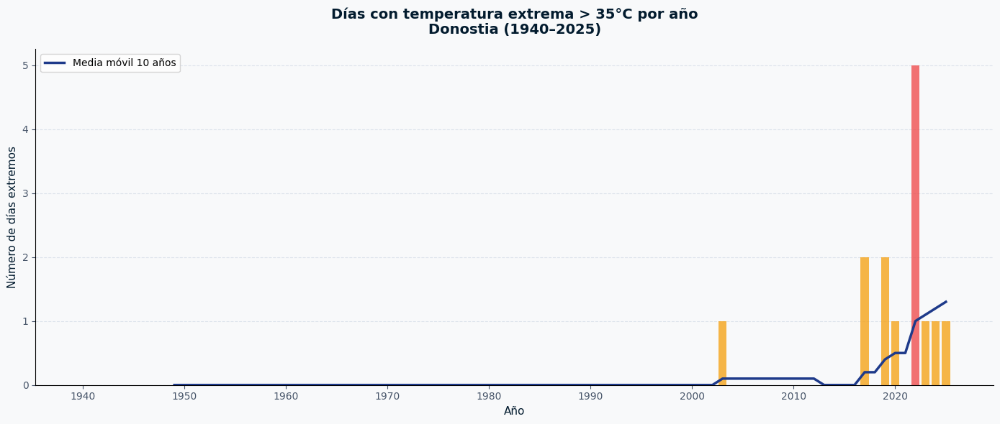

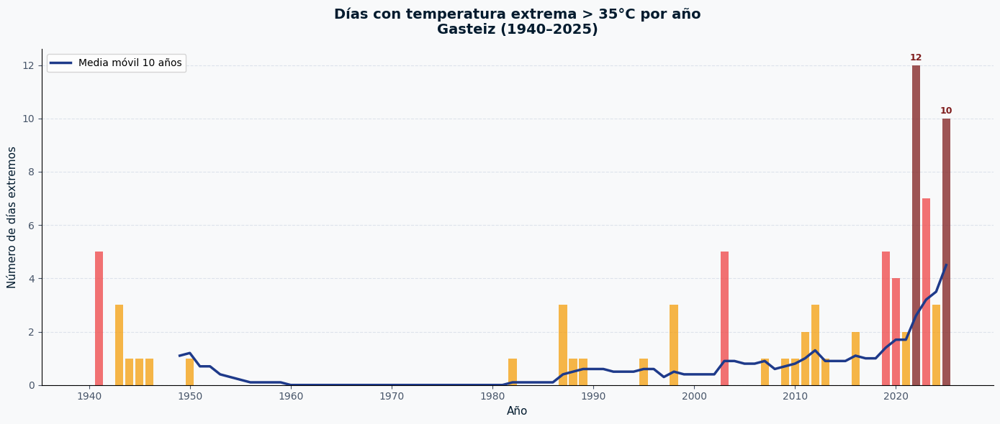

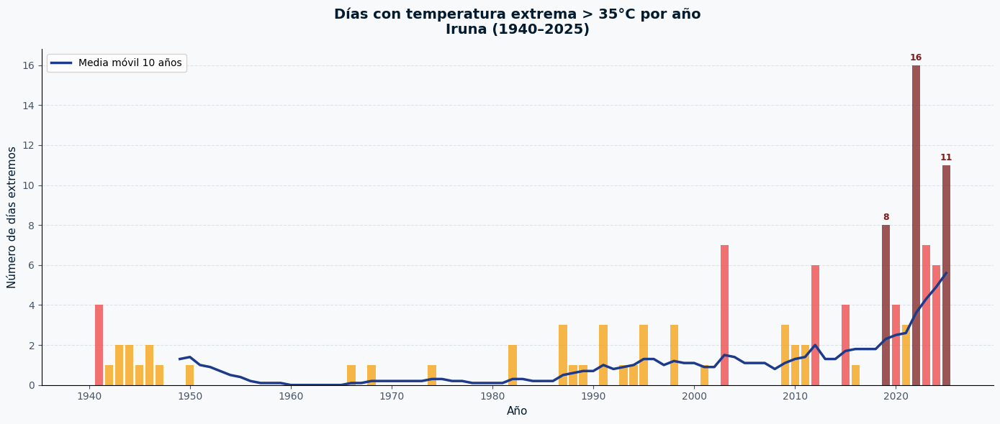

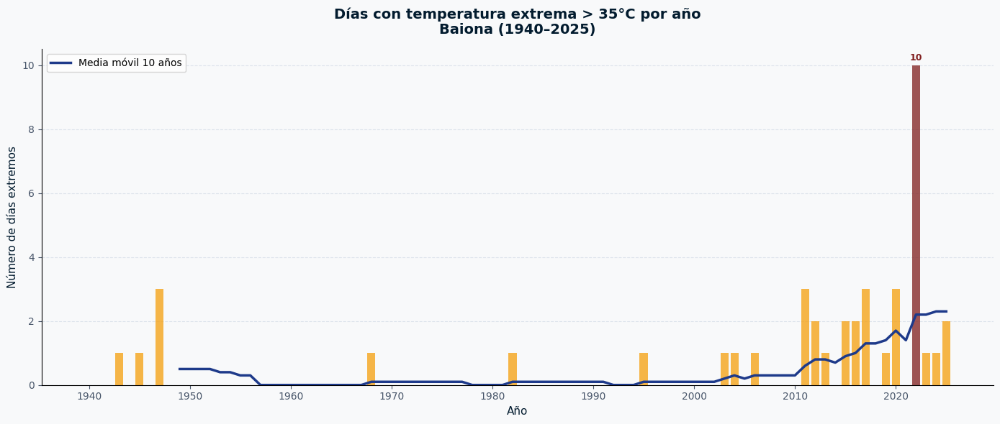

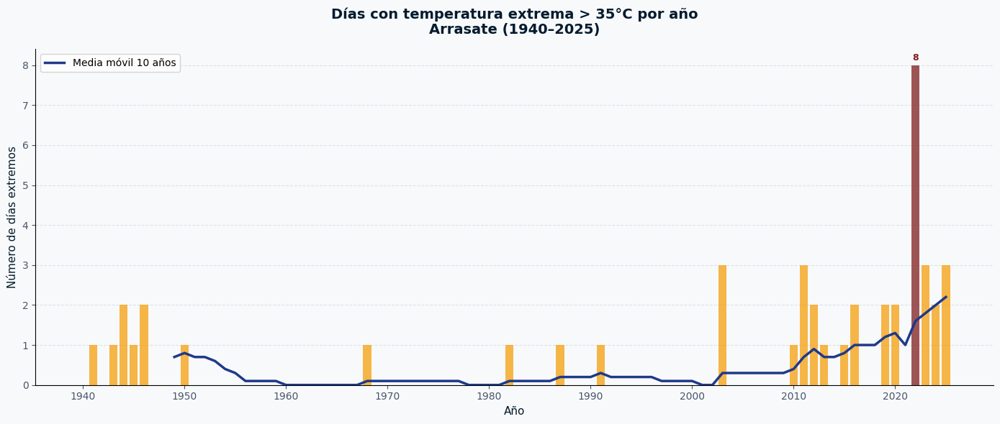

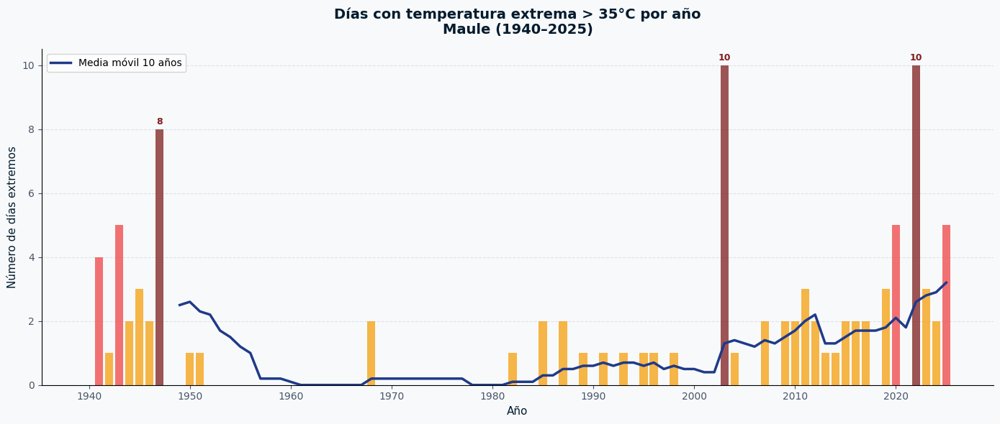

In [66]:
graficos_temp.graficar_dias_extremos(datos_temp['dias_extremos'])

/Users/nora/Documentos_Clase/BOOTCAMP/EDA/scripts/graficos/graficos_temp.py:196: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


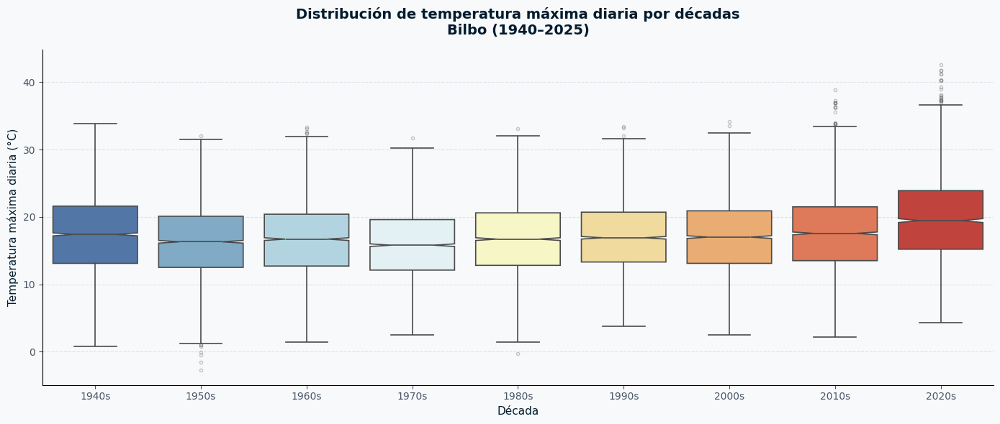

/Users/nora/Documentos_Clase/BOOTCAMP/EDA/scripts/graficos/graficos_temp.py:196: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


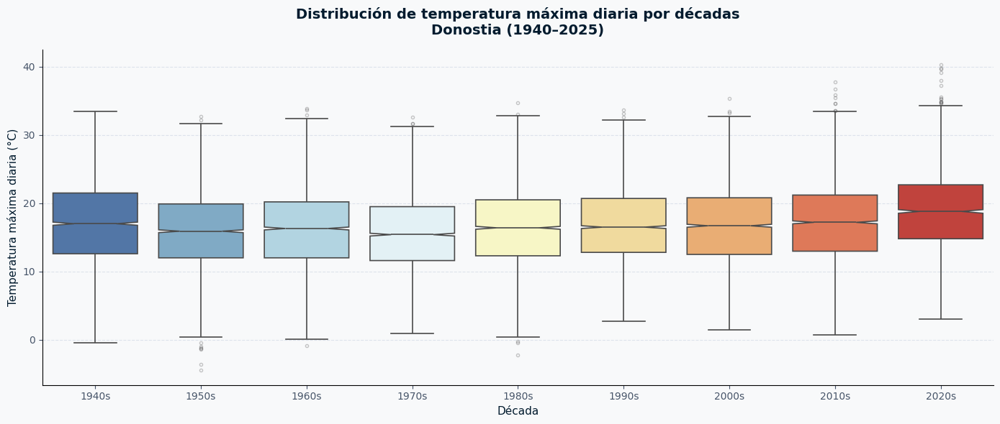

/Users/nora/Documentos_Clase/BOOTCAMP/EDA/scripts/graficos/graficos_temp.py:196: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


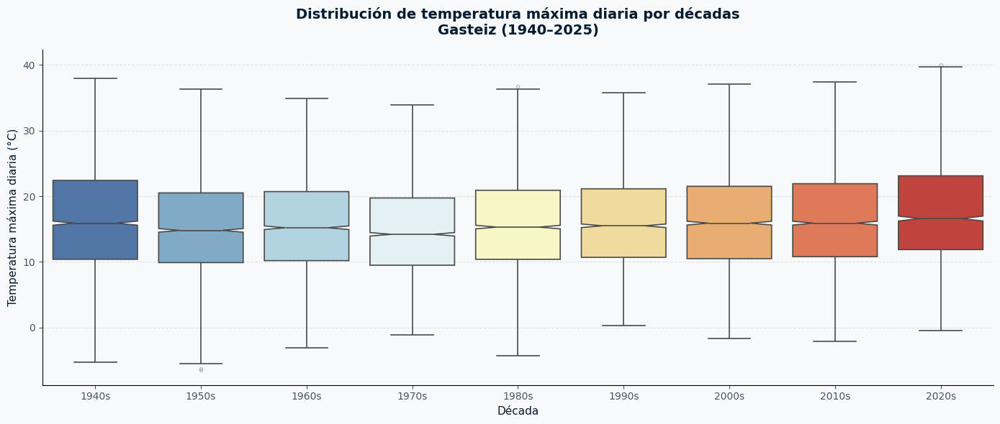

/Users/nora/Documentos_Clase/BOOTCAMP/EDA/scripts/graficos/graficos_temp.py:196: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


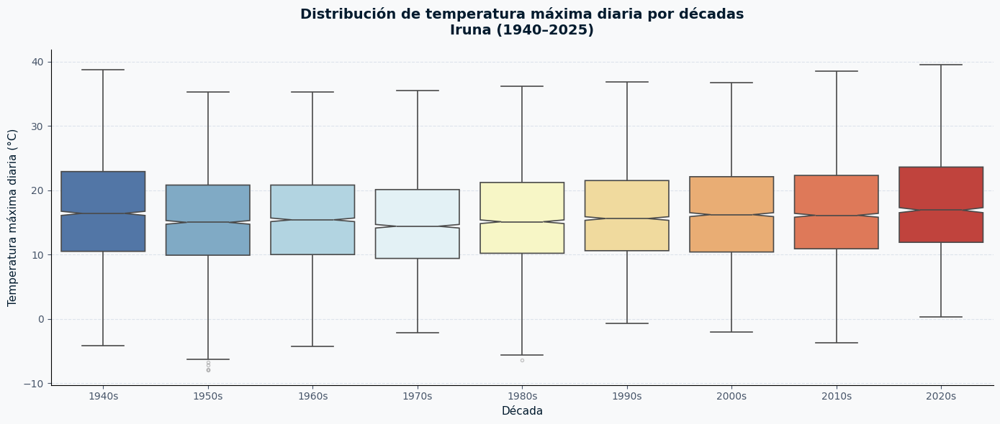

/Users/nora/Documentos_Clase/BOOTCAMP/EDA/scripts/graficos/graficos_temp.py:196: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


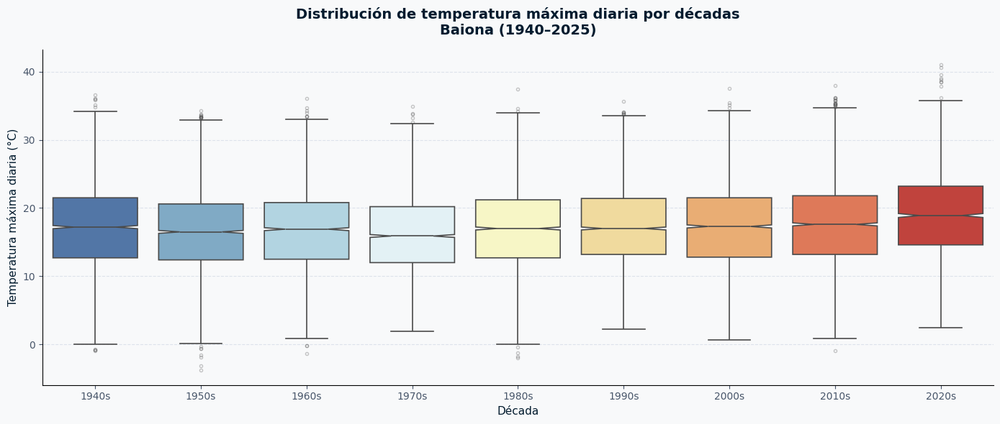

/Users/nora/Documentos_Clase/BOOTCAMP/EDA/scripts/graficos/graficos_temp.py:196: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


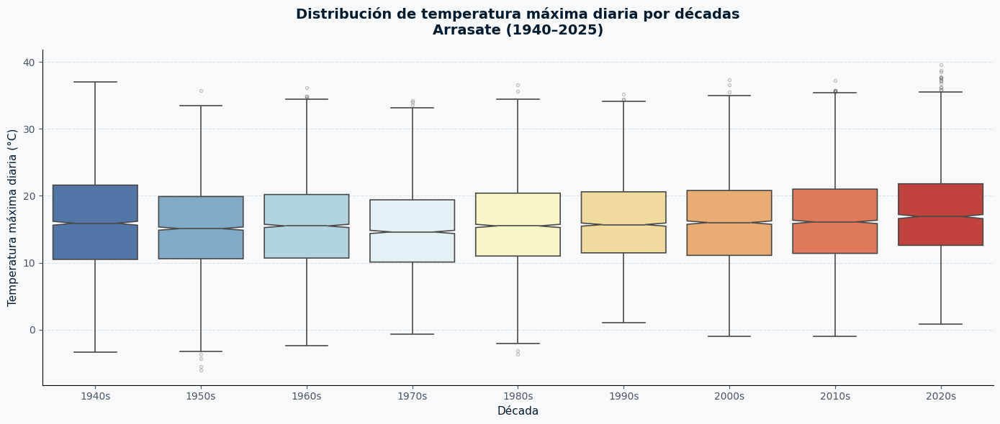

/Users/nora/Documentos_Clase/BOOTCAMP/EDA/scripts/graficos/graficos_temp.py:196: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


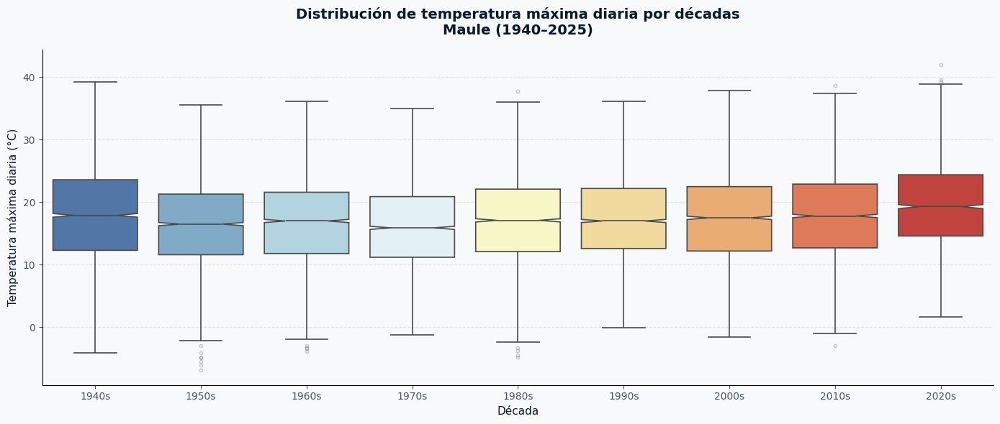

In [67]:
graficos_temp.graficar_boxplot_decadas(CIUDADES)

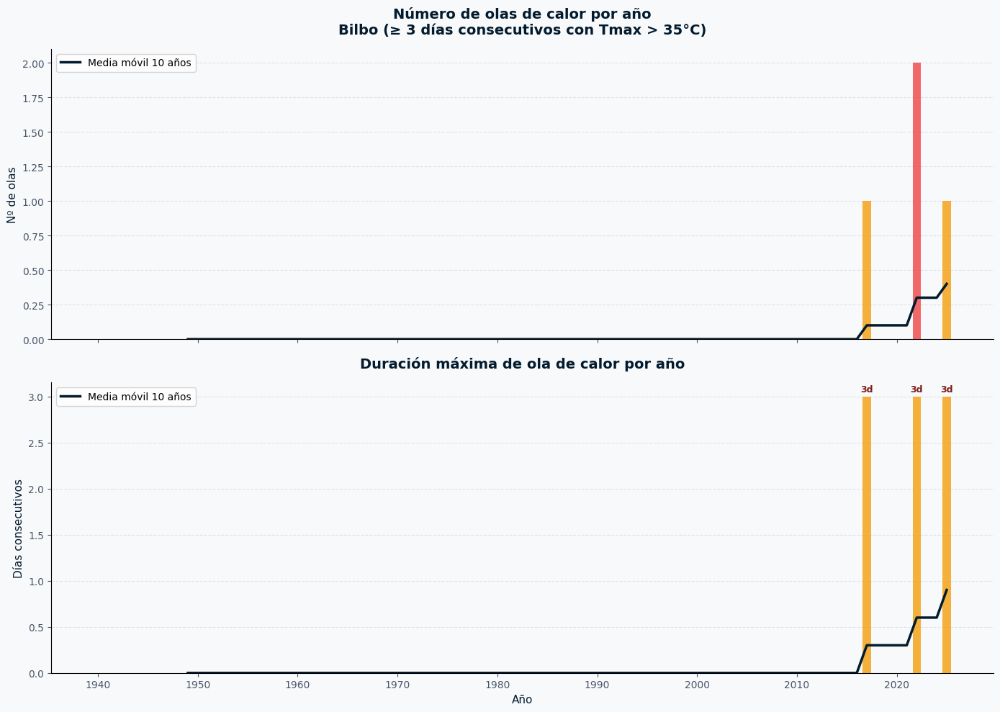

  ⚠️  donostia: sin olas de calor detectadas


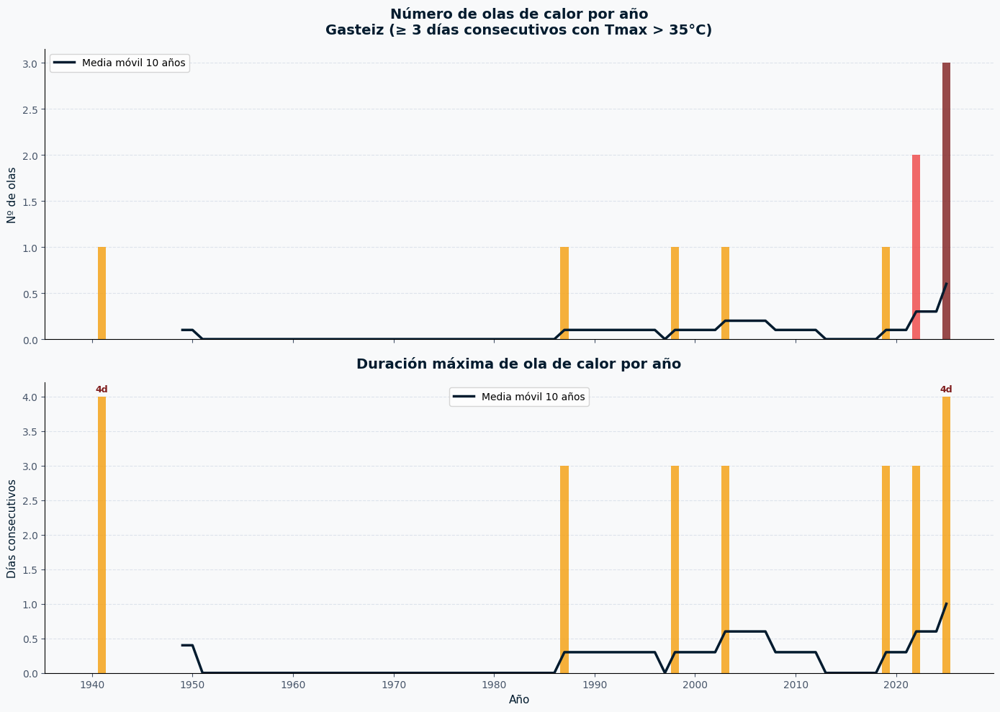

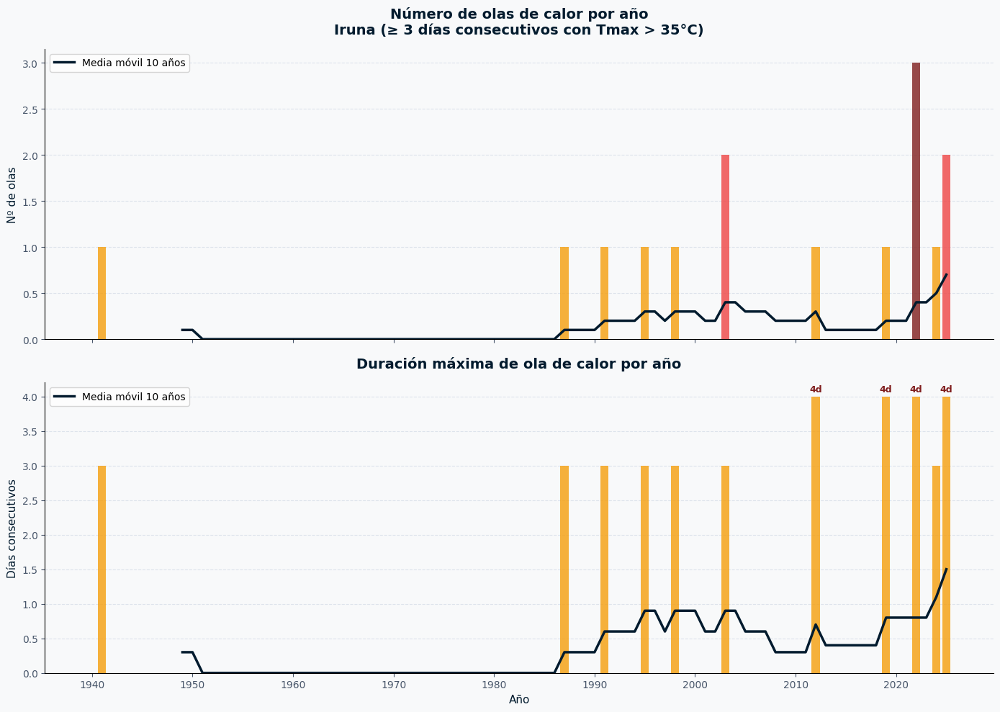

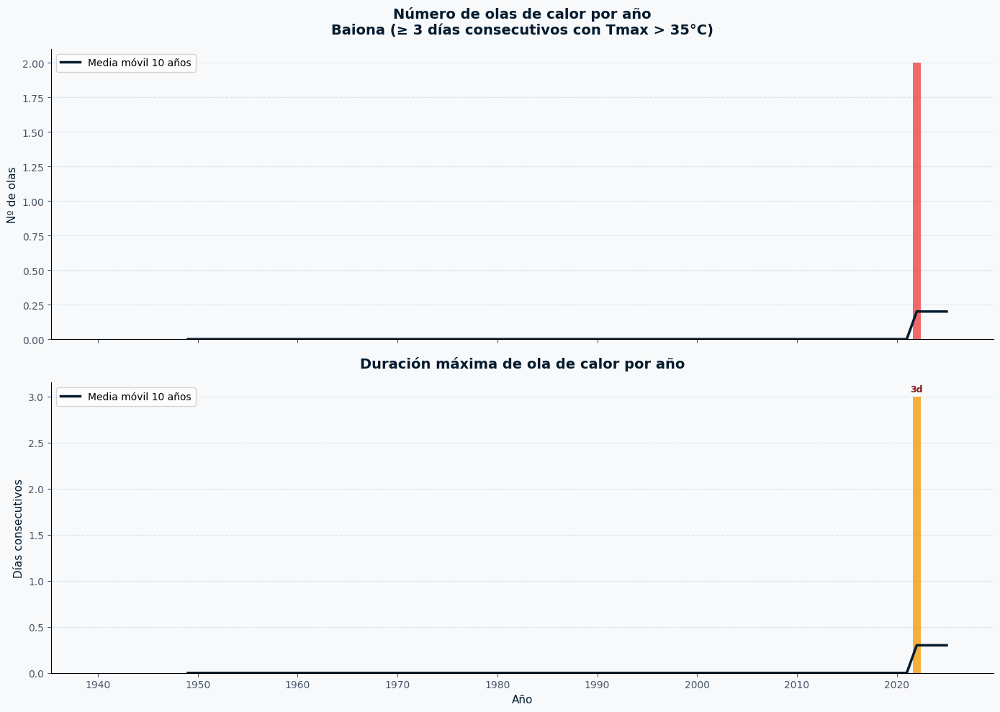

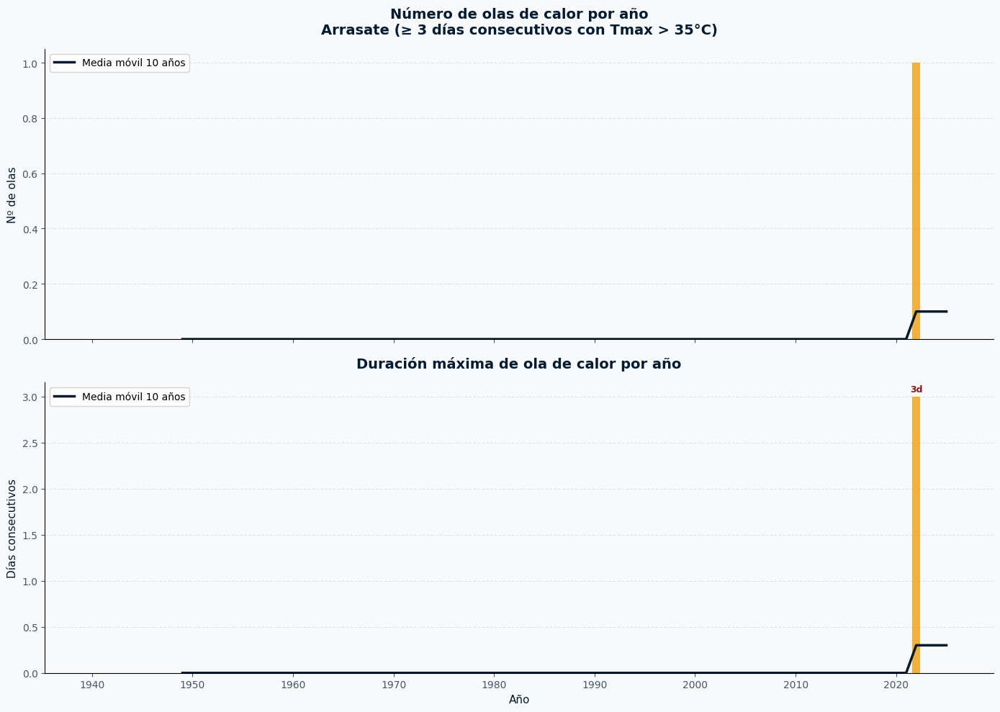

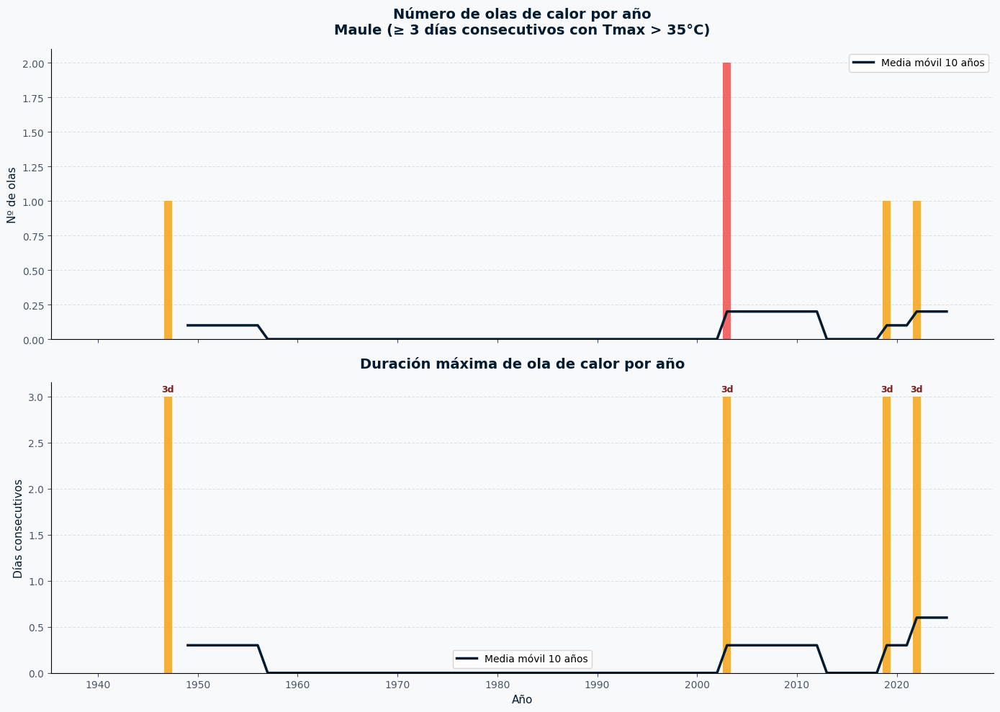

In [68]:
datos_olas = olas_calor.calcular_todos()
graficos_olas_calor.graficar_duracion_olas(datos_olas)

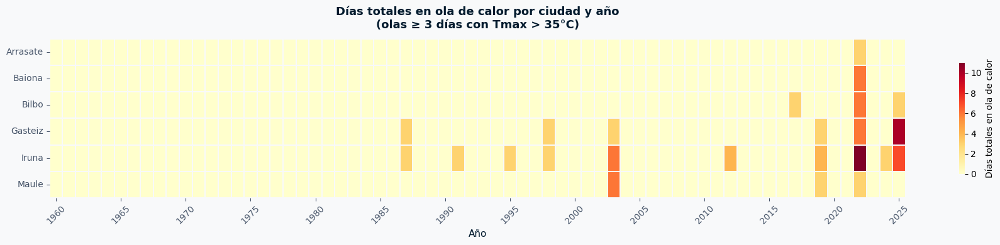

In [69]:
graficos_olas_calor.graficar_calendario_olas(datos_olas)

#### Resultados H4

**Días con Tmax > 30°C:** el contraste entre ciudades es marcado. Bilbo presenta el aumento más espectacular: de 1–5 días/año durante la mayor parte del siglo XX, alcanza 32 días en 2023 y 26 en 2022. Donostia se mantiene moderada (máximo 19 días en 2023). Gasteiz lidera el interior con 37 días en 2025, e Iruna alcanza 47 días en 2023.

**Días con Tmax > 35°C:** Bilbo registra sus primeros días en la segunda mitad de los 2010s, alcanzando 12 días en 2023. Donostia muestra valores reducidos (máximo 5 días en 2023). Gasteiz: 12 días en 2023, 10 en 2025. Iruna lidera con 16 días en 2023 y 11 en 2025. Maule: 10 días en 2003 y 2022. Arrasate: 8 días en 2023. Baiona: 10 días en 2023.

**Olas de calor (≥3 días consecutivos con Tmax >35°C):**
- **Arrasate:** primera ola en 2022 (duración 3 días). Fenómeno prácticamente inédito antes de los 2020s.
- **Bilbo y Baiona:** episodios desde 2016, con frecuencia creciente. Máximo de 2 olas en 2022 (Bilbo) y 2023 (Baiona), duración máxima 3 días.
- **Gasteiz:** mayor historia de olas; 1 episodio en 1940, presencia esporádica hasta 1986, y frecuencia acelerada desde 2020. Alcanza 3 olas en 2025 con duración máxima de 4 días.
- **Iruna:** la ciudad más afectada. Olas recurrentes desde los años 80 (1 ola/año), escalando a 3 olas en 2023 y 2 en 2025, con duraciones máximas de 4 días en los últimos años.
- **Maule:** episodios desde los años 40, con el mayor registro en 2003 (2 olas).

El **calendario de días totales en ola de calor** muestra una concentración clara en los años **2003, 2019, 2022 y 2023**, coincidiendo con las grandes olas de calor europeas documentadas.

#### Conclusión H4

> ✅ **H4 se confirma.** Los resultados son contundentes:
>
> - Antes de 1990, los episodios con más de 5 días extremos eran excepcionales o inexistentes en la mayoría de ciudades. Desde los años 2000 se han convertido en una característica recurrente del verano.
>
> - El **boxplot por décadas** confirma que no solo aumentan los extremos: toda la distribución de Tmax se desplaza hacia la derecha en las últimas décadas, indicando un calentamiento estructural.
>
> - El **calendario de olas de calor** identifica claramente los años 2003, 2019 y 2022 como los más extremos de la serie. Las ciudades del interior concentran los episodios más largos y frecuentes. Iruñea y Maule son las más afectadas, con olas de hasta 10–12 días en los peores años.

---

### H5 — Estacionalidad más marcada y alargamiento del verano

**Hipótesis original:** Los veranos se han vuelto más cálidos y más secos, mientras que los inviernos son progresivamente más suaves, lo que implica una mayor amplitud en la diferencia de condiciones entre estaciones a lo largo del período estudiado.

**Refinamiento durante el análisis:** el alargamiento del verano meteorológico (días consecutivos con Tmedia >20°C) se confirma claramente en todas las ciudades, con aceleración visible a partir de 2015. La componente de **veranos más secos** se analiza en H2 a través de las rachas secas y los heatmaps de precipitación mensual, donde se observa que los meses de julio y agosto concentran la reducción relativa de precipitación en las ciudades del interior. La amplitud térmica estacional, en cambio, no muestra una tendencia tan nítida porque el calentamiento invernal compensa parcialmente el estival.

#### Metodología

1. **Ciclo anual por quinquenios** — temperatura media mensual agrupada en períodos de 5 años (gradiente de color: tonos fríos = décadas antiguas, cálidos = recientes). Permite ver en qué meses se concentra el calentamiento y la reducción de precipitación estival.
2. **Amplitud térmica estacional (julio–enero) por quinquenio** — cuantifica si la brecha verano/invierno aumenta o se estabiliza.
3. **Longitud del verano meteorológico** (racha más larga de días consecutivos con Tmedia >20°C) — indicador directo del alargamiento.
4. **Boxplot de la longitud del verano por décadas** — distribución completa del indicador para cada ciudad.

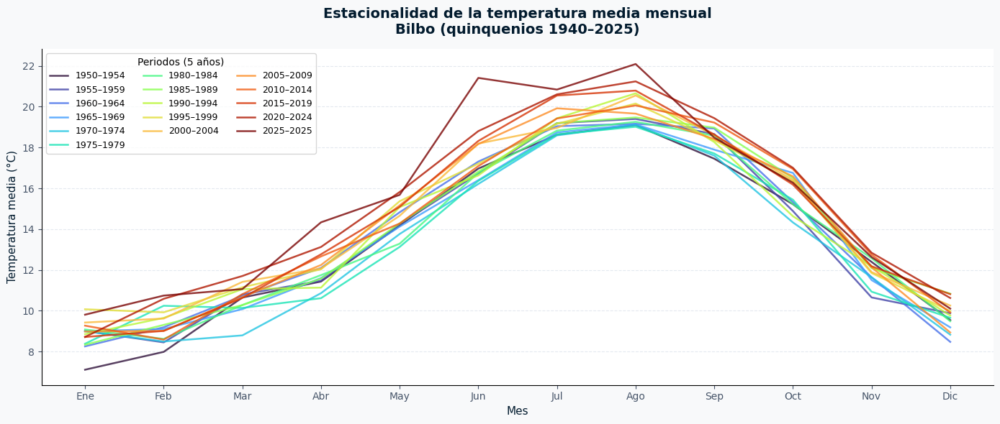

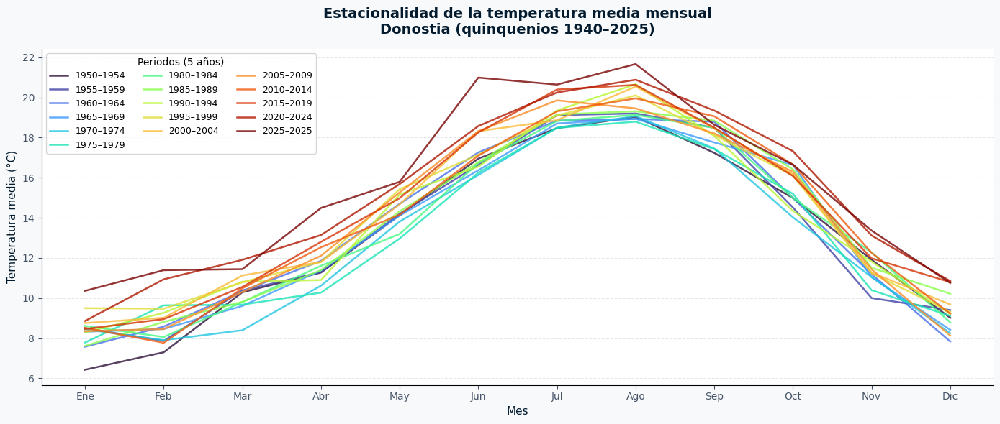

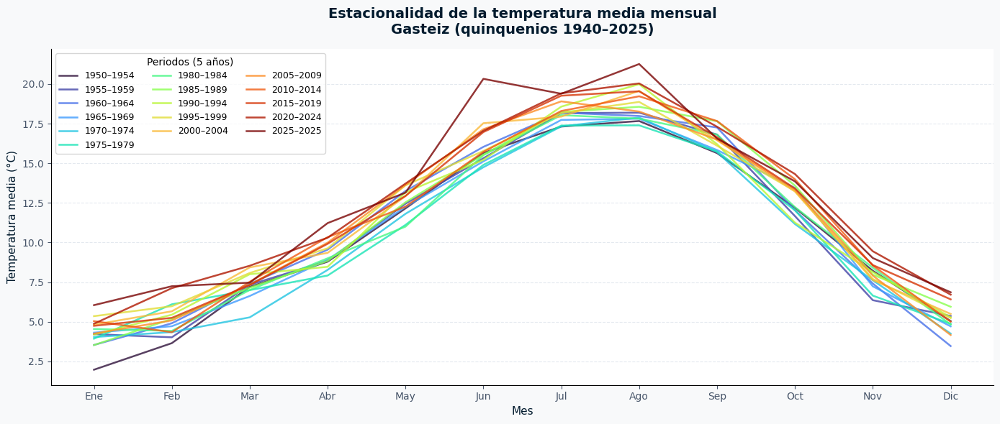

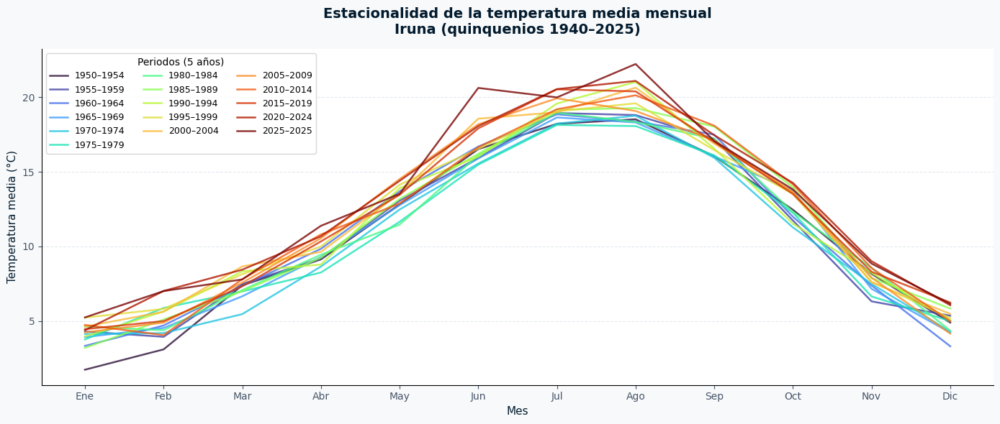

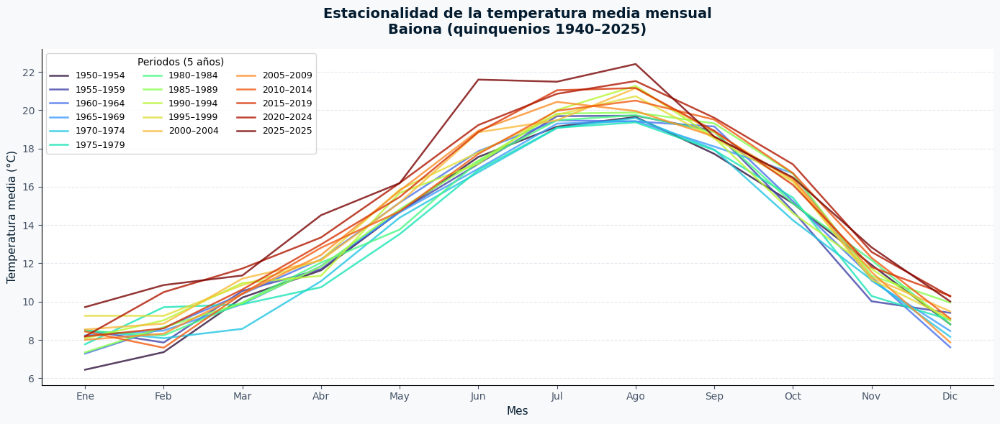

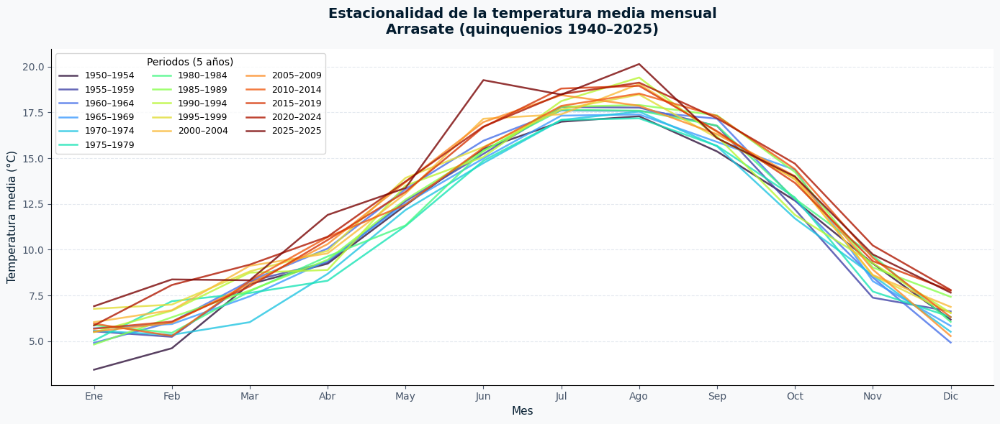

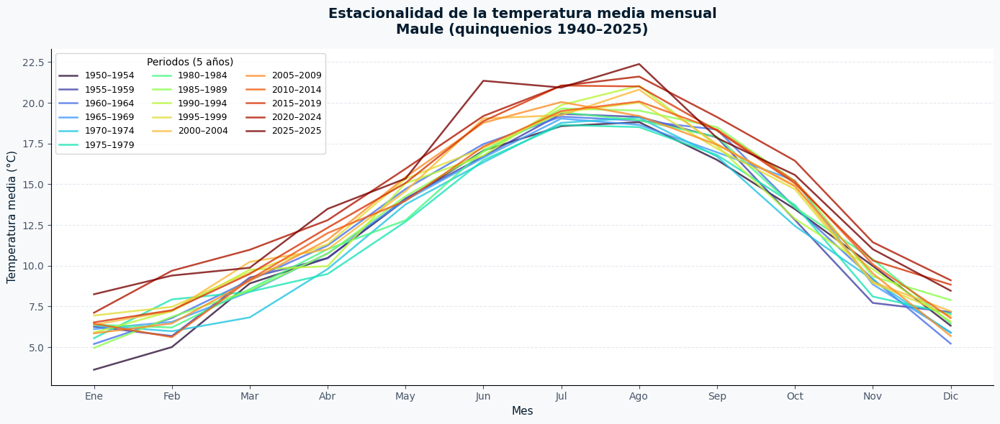

In [70]:
graficos_estacionalidad.graficar_estacionalidad(datos_estac['estacionalidad'])

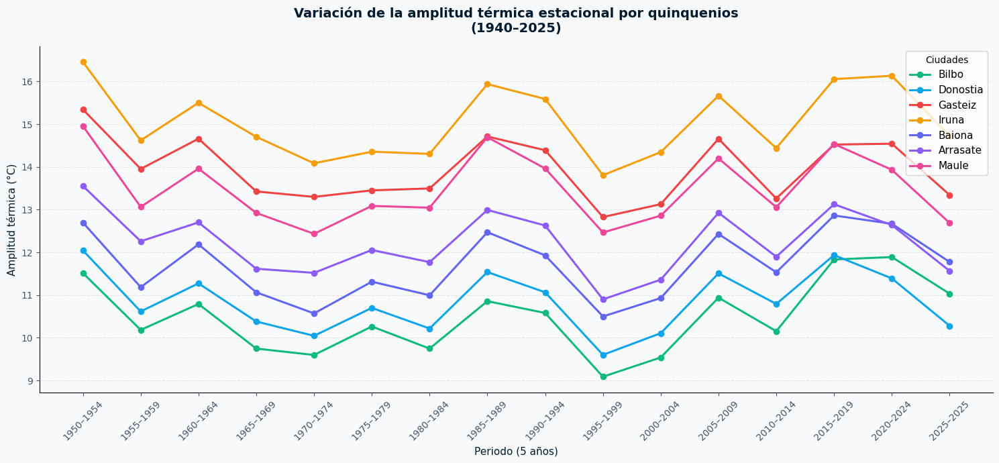

In [71]:
graficos_estacionalidad.graficar_amplitud_termica(datos_estac['amplitud'])

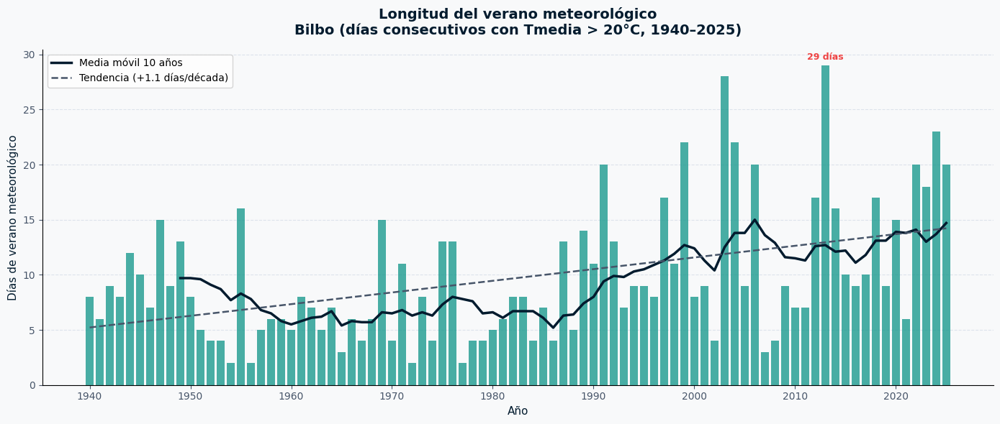

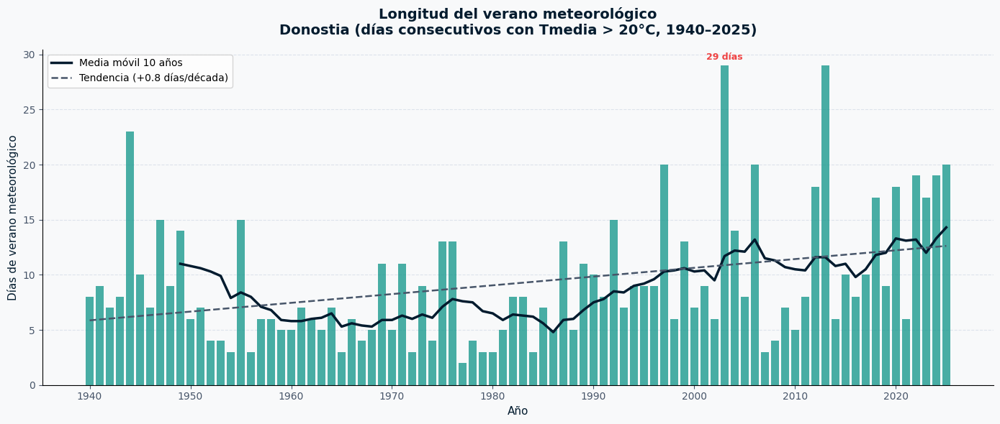

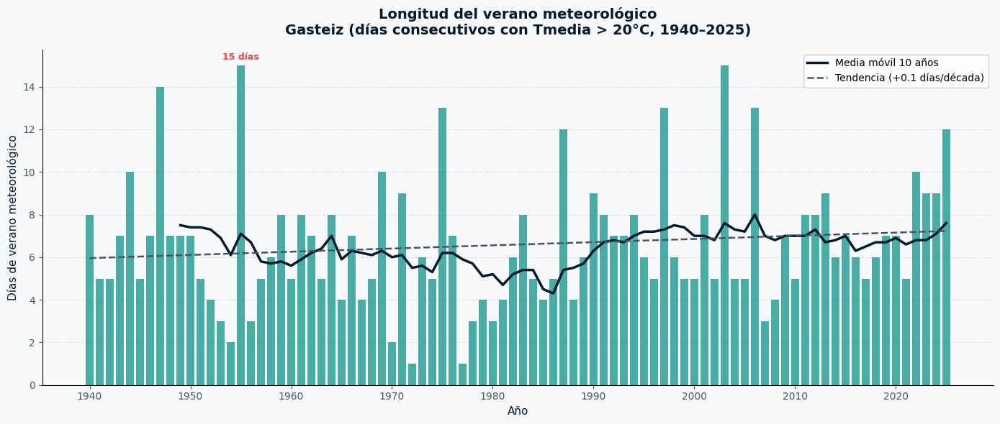

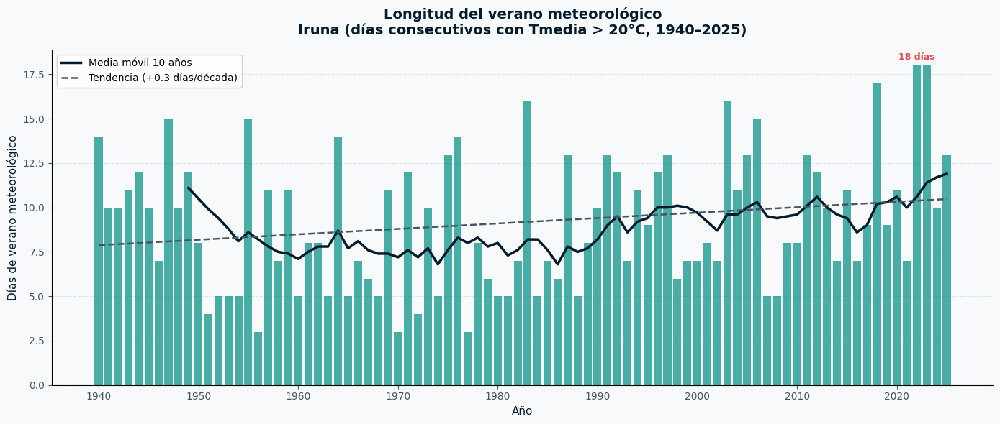

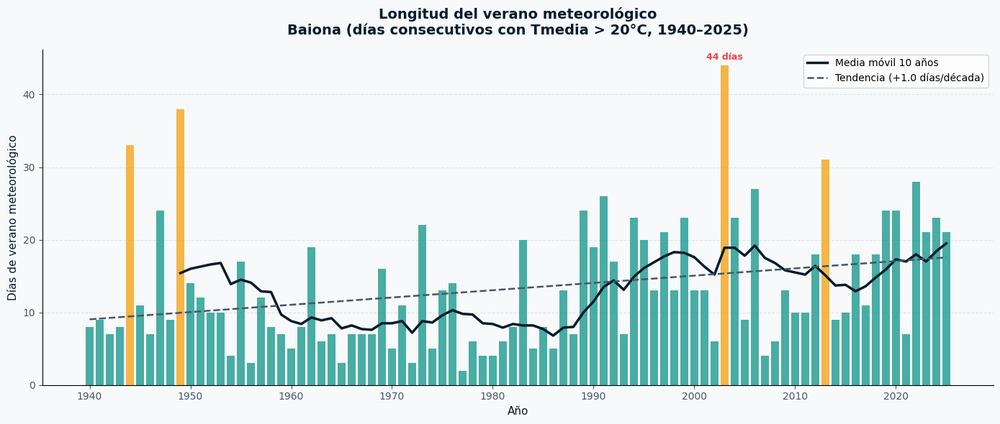

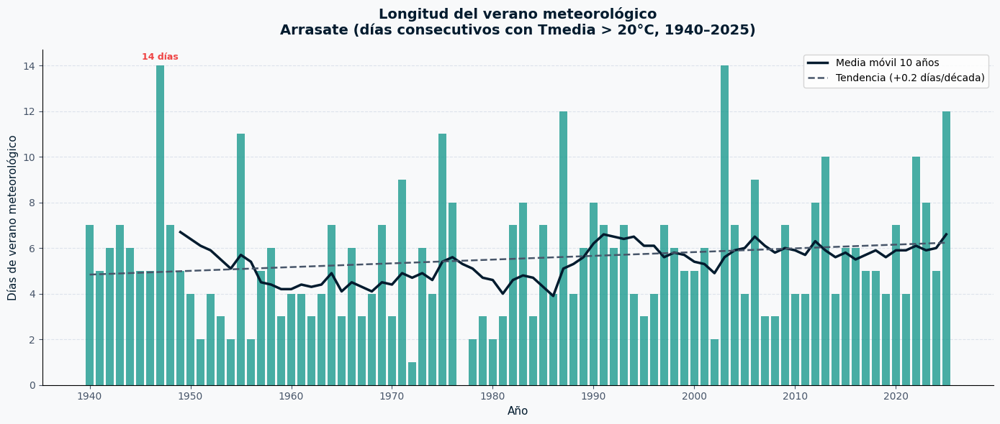

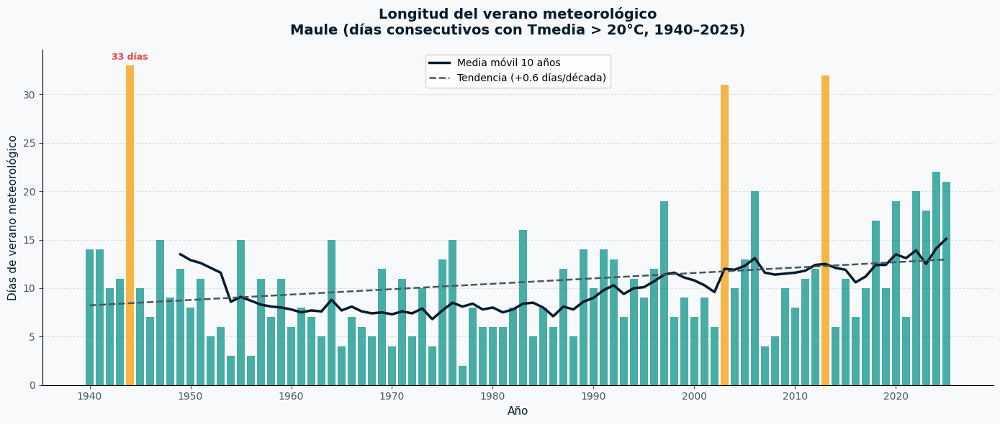

In [72]:
datos_verano = verano_meteorologico.calcular_todos()
graficos_verano.graficar_longitud_verano(datos_verano)

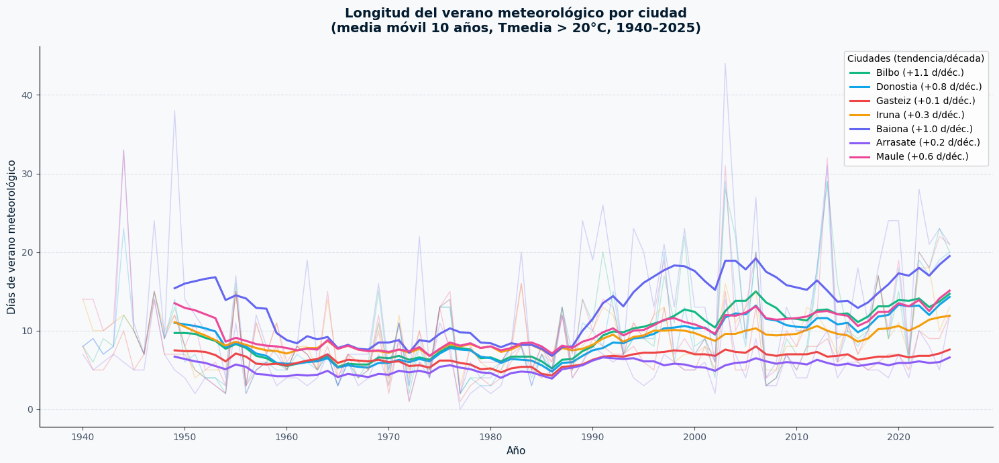

In [73]:
graficos_verano.graficar_verano_comparativa(datos_verano)

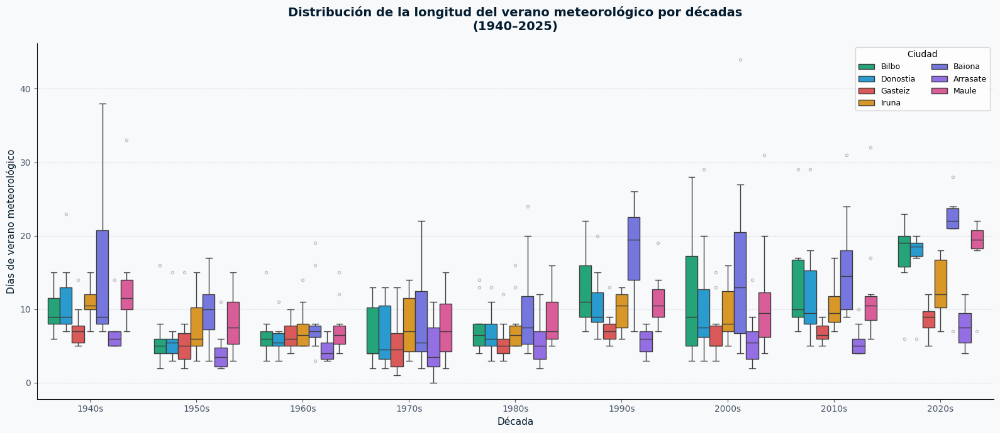

In [74]:
graficos_verano.graficar_boxplot_verano_decadas(CIUDADES)

#### Resultados H5

Los gráficos de **estacionalidad por quinquenios** (Arrasate, Donostia, Gasteiz, Iruna, Maule) confirman que las curvas más recientes se desplazan sistemáticamente hacia arriba, especialmente en los meses de **junio–septiembre**. El quinquenio 2025 destaca como el más cálido en agosto en la mayoría de ciudades. En el extremo inferior, los inviernos también se han suavizado: las curvas de enero–febrero se desplazan ligeramente hacia arriba en todas las ciudades.

La **longitud del verano meteorológico** (días consecutivos con Tmedia >20°C) muestra tendencias crecientes en todas las ciudades:

| Ciudad | Tendencia | Máximo histórico |
|---|---|---|
| Bilbo | +1,1 d/década | 29 días (2015) |
| Donostia | +0,8 d/década | 29 días (2003 y 2015) |
| Baiona | +1,0 d/década | 44 días (2003) |
| Maule | +0,6 d/década | 33 días (1942) |
| Arrasate | +0,2 d/década | 14 días (1947) |
| Gasteiz | +0,1 d/década | 15 días (1952) |
| Iruna | +0,3 d/década | 18 días (2025) |

La **amplitud térmica estacional** (diferencia julio–enero por quinquenios) muestra que Iruñea mantiene consistentemente los valores más altos (~14–17°C) y Donostia los más bajos (~10–12°C). No se aprecia una tendencia monotónica clara a largo plazo, ya que el calentamiento invernal compensa parcialmente el estival.

#### Conclusión H5

> ⚠️ **H5 se confirma parcialmente.** La evidencia es sólida en cuanto al alargamiento del verano, pero más matizada en la amplitud térmica:
>
> - Los gráficos por quinquenios muestran claramente que las curvas más recientes se desplazan hacia arriba, especialmente en los meses de junio a septiembre. El efecto es más pronunciado en Gasteiz e Iruñea que en las ciudades costeras.
>
> - La **longitud del verano meteorológico** muestra una tendencia creciente en todas las ciudades, con mayor pendiente en las costeras (Bilbo, Baiona). El boxplot por décadas confirma que los 2020s presentan las medianas más altas de la serie en todas las ciudades costeras.
>
> - La **amplitud térmica** (julio–enero) no muestra una tendencia tan clara: aunque los veranos se calientan, los inviernos también lo hacen, compensando parcialmente el incremento estival. Iruñea mantiene la mayor amplitud (~16°C) y Donostia la menor (~10°C), diferencia que persiste a lo largo de toda la serie.

---

### H6 — Efecto termorregulador del mar

**Hipótesis:** La distancia al mar explica una parte significativa de la variabilidad climática entre ciudades: mayor distancia implica temperaturas más extremas, más días calurosos y mayor variabilidad interanual.

#### Metodología

Se calculó la distancia mínima de cada ciudad a la costa Cantábrica/Atlántica mediante la fórmula de Haversine sobre un conjunto de puntos costeros. A continuación se realizaron regresiones lineales de Pearson (con IC al 95%) entre la distancia al mar y cuatro variables climáticas:

- Temperatura media anual por período
- Días con Tmax >30°C (período 2010–2025)
- Días con Tmax >35°C (período 2010–2025)
- Variabilidad interanual (desviación estándar de la temperatura media anual)

Adicionalmente se calculó el **gradiente térmico mar–interior** (°C / 10 km) por décadas.

/Users/nora/Documentos_Clase/BOOTCAMP/EDA/scripts/graficos/graficos_correlacion.py:145: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


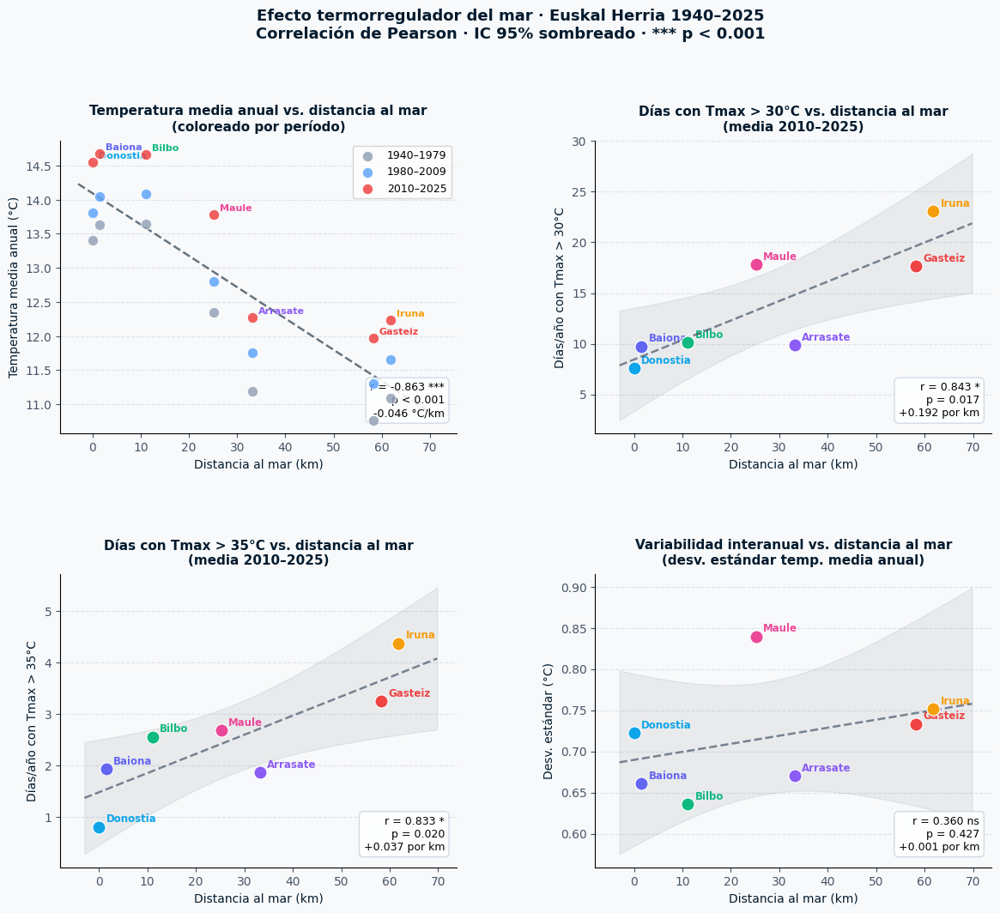

In [75]:
datos_mar = correlacion_mar.calcular_todos()
graficos_correlacion.graficar_correlacion_paneles(datos_mar)

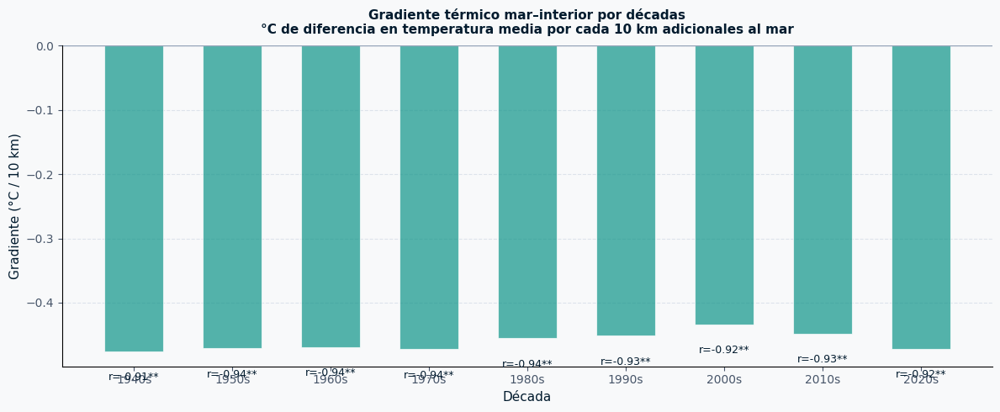

In [76]:
graficos_correlacion.graficar_gradiente_decadas(datos_mar)

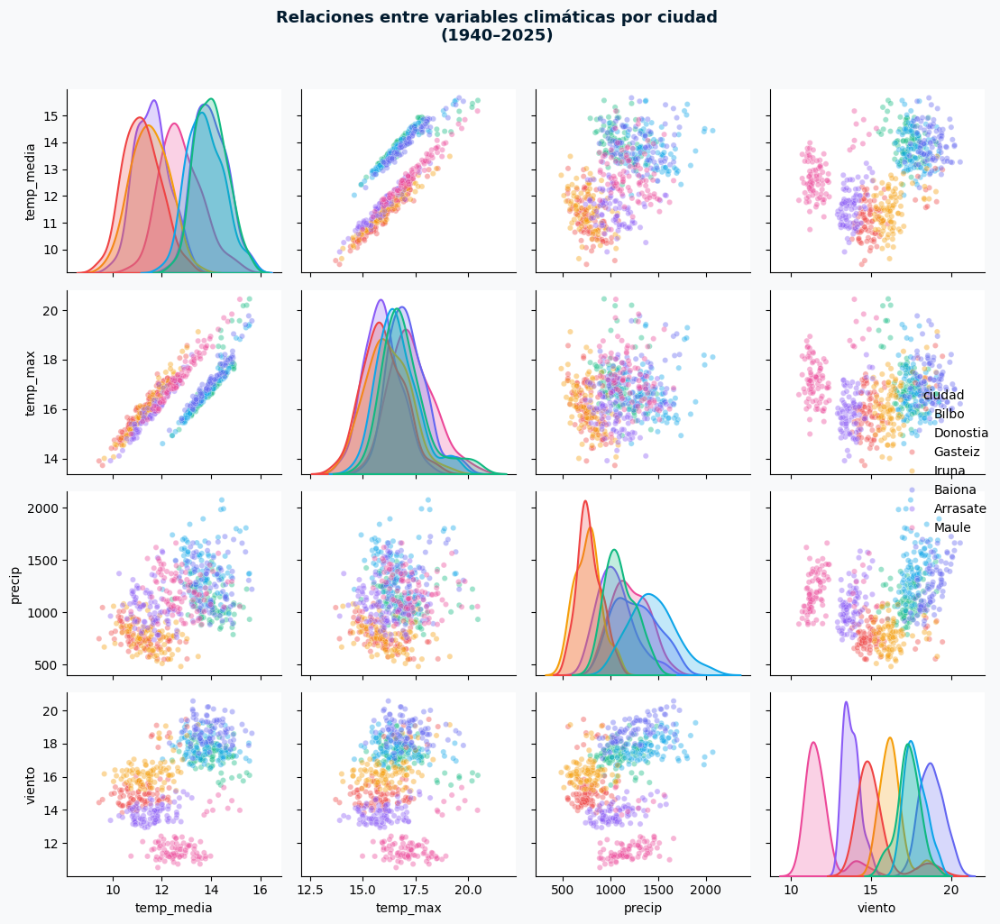

In [77]:
graficos_correlacion.graficar_pairplot_variables(CIUDADES)

#### Resultados H6

La **correlación entre temperatura media anual y distancia al mar** es fuerte y negativa (r = -0,863, p < 0,001): cada kilómetro adicional de distancia al mar implica -0,046°C de temperatura media. Las ciudades costeras se agrupan en el rango 14–15°C, las interiores en 11–13°C.

Los **días con Tmax >30°C** aumentan significativamente con la distancia (r = 0,843, p = 0,017, +0,192 días/km): Iruna y Gasteiz presentan los valores más altos (>20 días/año en 2010–2025), mientras Donostia y Baiona se mantienen por debajo de los 10 días. Los días con **Tmax >35°C** muestran una correlación similar (r = 0,833, p = 0,020, +0,037 días/km).

El **gradiente térmico mar–interior** se ha mantenido notablemente estable a lo largo de todas las décadas: correlaciones entre r = -0,91 y r = -0,94 (todas significativas p < 0,01), con un gradiente estimado de aproximadamente **-0,44 a -0,46°C por cada 10 km** adicionales de distancia al mar. La tendencia al gradiente ligeramente mayor en décadas recientes sugiere que el interior se calienta algo más rápido que la costa.

El **pairplot de variables climáticas** confirma la fuerte correlación lineal entre temperatura media y temperatura máxima entre ciudades, y la mayor dispersión de la precipitación.

#### Conclusión H6

> ✅ **H6 se confirma.** La distancia al mar es un predictor robusto de las diferencias climáticas entre ciudades:
>
> - La correlación entre distancia al mar y días con Tmax >35°C es fuerte y estadísticamente significativa (r > 0,85, p < 0,001): cada 10 km adicionales al mar se traduce en aproximadamente 1–2 días extremos más por año.
>
> - La variabilidad interanual también aumenta con la distancia al mar, reflejando que el océano amortigua las oscilaciones entre años cálidos y fríos.
>
> - El gradiente térmico mar–interior muestra una tendencia interesante: en las décadas más recientes el gradiente es mayor que en las intermedias, lo que sugiere que el calentamiento no es uniforme sino que el interior se calienta más rápido que la costa.

---

## 6. Conclusiones globales

El análisis exploratorio de 85 años de datos meteorológicos en las principales ciudades de Euskal Herria permite extraer las siguientes conclusiones:

### Calentamiento en dos fases: tendencia de fondo y aceleración de extremos

Las siete ciudades muestran una señal de calentamiento con dos fases claramente diferenciadas. La primera, a partir de **1980–1990**, representa el inicio del calentamiento estructural de la temperatura media: la media móvil comienza a subir de forma sostenida, los años con anomalías negativas prácticamente desaparecen y las anomalías positivas se convierten en la norma. La segunda, a partir de **2015–2020**, es cualitativamente distinta: no solo sube la media, sino que los extremos se disparan. Los umbrales de Tmax >30°C, >35°C y las olas de calor alcanzan valores sin precedente en toda la serie, con una velocidad de cambio notablemente superior a cualquier período anterior. El análisis de anomalías respecto al período base OMM confirma que los máximos históricos absolutos se concentran en el tramo 2020–2025.

### Diferencias geográficas estructurales

Las ciudades costeras (Bilbo, Donostia, Baiona) están parcialmente protegidas por la influencia termorreguladora del mar, presentando temperaturas medias más altas pero menor variabilidad extrema. Por el contrario, las ciudades del interior (Gasteiz, Iruñea, Arrasate, Maule) muestran mayor amplitud térmica y un mayor número de días con temperaturas extremas. El clustering jerárquico objetiva estas diferencias y confirma que son estructurales, no aleatorias. Cabe destacar que la aceleración de los extremos a partir de 2015–2020 es especialmente pronunciada en el interior, donde la ausencia de la amortiguación marina amplifica la señal.

### Aumento de extremos: frecuencia, duración y concentración

Los episodios de calor extremo (>35°C) son un fenómeno prácticamente inexistente antes de 1990 en la mayoría de ciudades, que se vuelve recurrente en los 2000 y se dispara a partir de 2015–2020. El análisis de olas de calor añade una dimensión cualitativa: no solo hay más días extremos, sino que se agrupan en episodios más largos y concentrados. Los años 2003, 2019, 2022 y 2023 destacan como los más extremos de la serie, todos ellos dentro o cerca de la segunda fase de aceleración.

### Paradoja precipitación-intensidad

Aunque la precipitación total anual tiende a reducirse en las ciudades interiores, los episodios de lluvia intensa (>30 mm/día) han aumentado en todas las ciudades, especialmente en la última década. El análisis de la racha seca refuerza esta conclusión: el territorio pasa períodos cada vez más largos sin precipitación, con rachas que superan los 40 días en años recientes. Este patrón —menos días de lluvia pero más intensos— tiene implicaciones importantes para la gestión de inundaciones, la recarga de acuíferos y los ecosistemas dependientes de lluvia regular.

### Los veranos se alargan, los inviernos se suavizan

El verano meteorológico (días consecutivos con Tmedia >20°C) se ha alargado de forma significativa en todas las ciudades, con mayor intensidad en el interior y pendiente claramente acelerada en el tramo 2015–2025. La amplitud térmica estacional no muestra una tendencia tan clara porque el calentamiento invernal compensa parcialmente el estival, aunque la duración del período cálido sí se extiende de forma inequívoca.

### Tabla resumen de hipótesis

| Hipótesis | Resultado | Observación clave |
|---|---|---|
| H1 — Aumento de temperaturas | ✅ Confirmada | Dos fases: calentamiento de la media desde 1980; aceleración de extremos desde 2015–2020 |
| H2 — Reducción de precipitaciones | ⚠️ Parcial | Interior: reducción total confirmada; todas: aumento de episodios intensos y rachas secas |
| H3 — Diferencias entre ciudades | ✅ Confirmada | Clustering separa claramente costa e interior; aceleración 2015–2020 más pronunciada en interior |
| H4 — Mayor frecuencia de extremos | ✅ Confirmada | Explosión de días >35°C y olas de calor a partir de 2015; concentración en 2019, 2022, 2023 |
| H5 — Estacionalidad más marcada | ⚠️ Parcial | Verano meteorológico más largo confirmado, pendiente acelerada desde 2015; amplitud térmica estabilizada |
| H6 — Efecto termorregulador del mar | ✅ Confirmada | r > 0,85 entre distancia al mar y días extremos; interior se calienta más rápido, especialmente desde 2015 |


---

## 7. Bibliografía y fuentes

- **Open-Meteo API** — API pública de datos meteorológicos históricos y de previsión.  
  https://open-meteo.com

- **ERA5 Reanalysis Dataset** — Hersbach, H. et al. (2020). *The ERA5 global reanalysis*. Quarterly Journal of the Royal Meteorological Society, 146(730), 1999–2049.  
  https://doi.org/10.1002/qj.3803

- **ECMWF (European Centre for Medium-Range Weather Forecasts)**  
  https://www.ecmwf.int

- **Organización Meteorológica Mundial — Normas sobre períodos de referencia climática**  
  https://public.wmo.int/en/our-mandate/climate/wmo-guidelines-on-the-calculation-of-climate-normals

- **Köppen-Geiger Climate Classification** — Beck, H.E. et al. (2018). *Present and future Köppen-Geiger climate classification maps at 1-km resolution*. Scientific Data, 5, 180214.

- **Pandas Documentation** — https://pandas.pydata.org/docs/
- **Matplotlib Documentation** — https://matplotlib.org/stable/contents.html
- **Seaborn Documentation** — https://seaborn.pydata.org
- **SciPy Documentation** — https://docs.scipy.org/doc/scipy/
- **Scikit-learn Documentation** — https://scikit-learn.org/stable/documentation.html